# 0 Loading packages <a name="loading"></a> 

In [1]:
import sys
print(sys.executable)
print(sys.path)
print(sys.version)

/home2/s418610/.conda/envs/py37_res_PAGA/bin/python
['/home2/s418610/jupyter_notebooks/03.Invivo_neuronal_reprogramming/Manuscript/to_GitHub', '', '/cm/shared/apps/cnvkit/0.9.5/lib/python3.6/site-packages', '/cm/shared/apps/python/3.6.4-anaconda/lib', '/cm/shared/apps/jupyterkernel-matlab/0.16.1/lib/python3.6/site-packages', '/cm/shared/apps/python/2.7.x-anaconda/lib', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python37.zip', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/lib-dynload', '/home2/s418610/.local/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/fa2-0.3.5-py3.7-linux-x86_64.egg', '/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/IPython/extensions', '/home2/s418610/.ipython']
3.7.3 (default, Mar 27 2019, 22:11:17) 
[GCC 7.3.0]


In [2]:
import re
from pathlib import Path
import numpy as np
import pandas as pd
import scipy.sparse
import sklearn.manifold
import statsmodels.api as sm

# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pyclustering.cluster.kmedoids import kmedoids

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
# import seaborn as sb

import scanpy as sc
import harmonypy as hm

In [3]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

print('numpy', np.__version__)
print('pandas', pd.__version__)
print('scipy', scipy.__version__)
print('sklearn', sklearn.__version__)
print('statsmodels', sm.__version__)
print('matplotlib', mpl.__version__)
print('seaborn', sns.__version__)

sc.logging.print_versions()

!date +%F

numpy 1.17.2
pandas 0.25.2
scipy 1.3.1
sklearn 0.21.3
statsmodels 0.10.1
matplotlib 3.0.3
seaborn 0.9.0
scanpy==1.4.5.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.3.1 pandas==0.25.2 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1
2020-08-20


In [4]:
import anndata
import pickle

In [5]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess

In [6]:
from scipy.stats import chi2_contingency

In [7]:
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2)) 

In [8]:
import os

# set a working directory for saving plots
wdir = "/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2"
# wdir = "/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures/Figure2/"
os.chdir( wdir )

# 1 Load data

In [10]:
# A sub-directory for saving intermediate data for organized pipeline v21
data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/PipelineOrganized_v1/'

In [11]:
neural_data_dir = data_dir + 'NeuralOnly/'

In [11]:
adata_tmp = sc.read(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony_louvain_ann_rankPseudotime.h5ad')

In [12]:
adata_tmp

AnnData object with n_obs × n_vars = 9928 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'diffmap_evals', 'iroot', 'library_name_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'Harmony', 'X_diffmap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [13]:
adata_neural = sc.read(neural_data_dir + 'POv2_NeuralOnly_postFiltering_log_pcs50_Harmony.h5ad')

In [15]:
adata_neural

AnnData object with n_obs × n_vars = 10523 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [14]:
assert adata_neural.X.shape == (10523, 2499)

assert sum(adata_neural.obs['batch'] == 'experiment') == 5056

assert sum(adata_neural.obs['batch'] == '10X') == 5467

In [16]:
adata_neural = adata_neural[adata_tmp.obs.index] # Remove oligodendrocytes and public GABAergic neurons

In [17]:
adata_neural

View of AnnData object with n_obs × n_vars = 9928 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [18]:
adata_experiment_neural = adata_neural[adata_neural.obs['batch'] == 'experiment']

In [19]:
adata_experiment_neural

View of AnnData object with n_obs × n_vars = 4863 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'pca'
    obsm: 'Harmony', 'X_pca'
    varm: 'PCs'
    layers: 'counts'

# 2 Cluster cells and annotate clusters

### 2.1 Cluster cells with Harmonized PCA matrix calculated with previously

computing neighbors
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


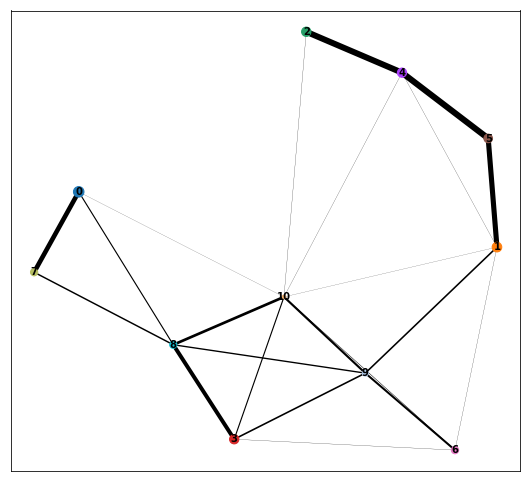

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


In [20]:
sc.pp.neighbors(
    adata_experiment_neural,
#    use_rep='X_pca',  
    use_rep='Harmony',  
#    random_state=random_seed
)

sc.tl.louvain(
    adata_experiment_neural,
    resolution=1.00,
#    resolution=1.50,
    #    random_state=random_seed
)

sc.tl.paga(
    adata_experiment_neural,
    groups='louvain',  
)

sc.pl.paga(
    adata_experiment_neural, 
    color=['louvain'], 
    use_raw=True,
#    use_raw=False,
#    layout='fa', 
    layout='fr', 
    threshold=0.01, 
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed, 
)

sc.tl.umap(
    adata_experiment_neural,
    init_pos='paga', 
#    random_state=random_seed,
)

#sc.pl.pca_scatter(adata, color='n_counts')
#sc.pl.pca_scatter(adata, color='library_name')
#sc.pl.tsne(adata, color='n_counts')

In [21]:
adata_experiment_neural.write(neural_data_dir + 'POv2_BL41-42Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

### 2.2 Plot relevant information and marker genes

In [22]:
adata_experiment_neural = sc.read(neural_data_dir + 'POv2_BL41-42Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain.h5ad')

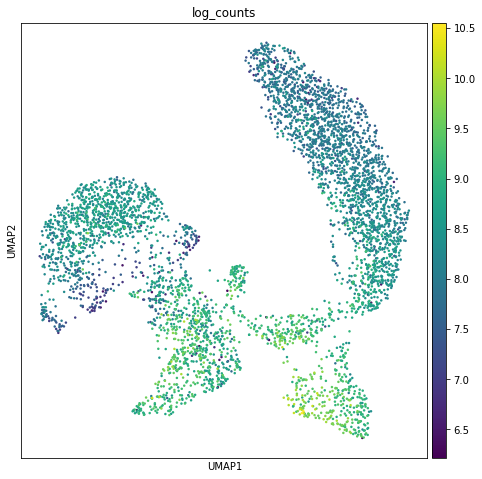

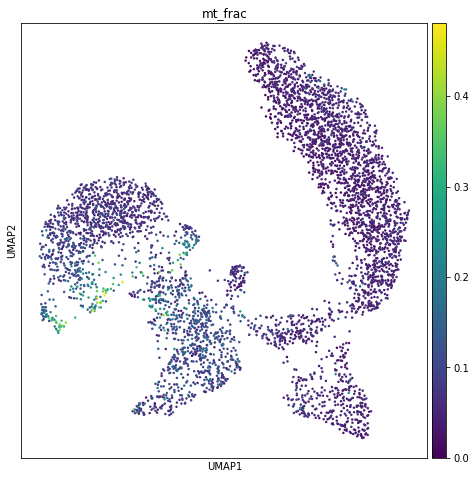

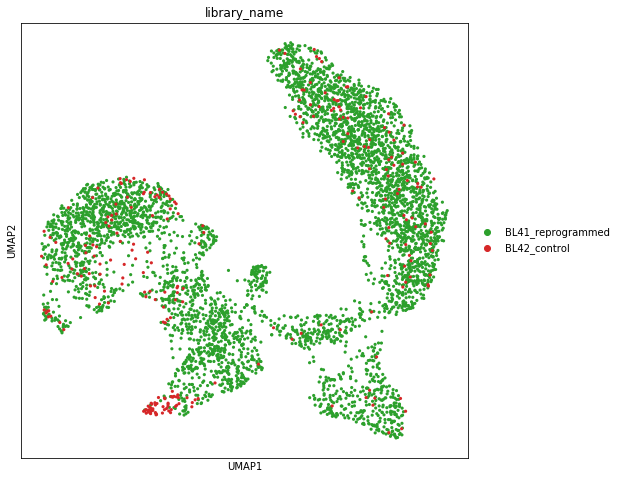

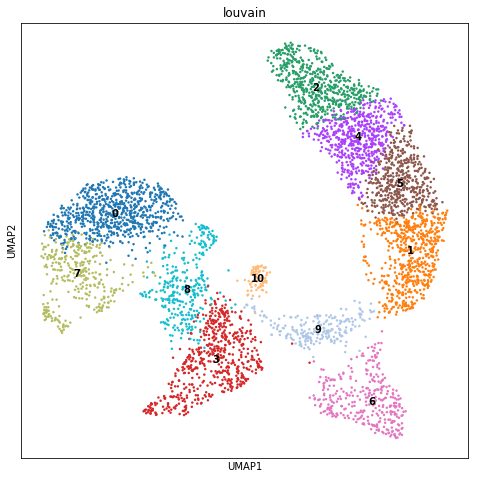

In [23]:
# Visualize sequencing depth, library distribution, and Louvain clusters
# Figure 4B
sc.pl.umap(adata_experiment_neural, color='log_counts')
sc.pl.umap(adata_experiment_neural, color='mt_frac')
sc.pl.umap(adata_experiment_neural, color='library_name', size=40, 
#          save='_library_name.pdf'
          )
sc.pl.umap(adata_experiment_neural, color='louvain', legend_loc='on data', )

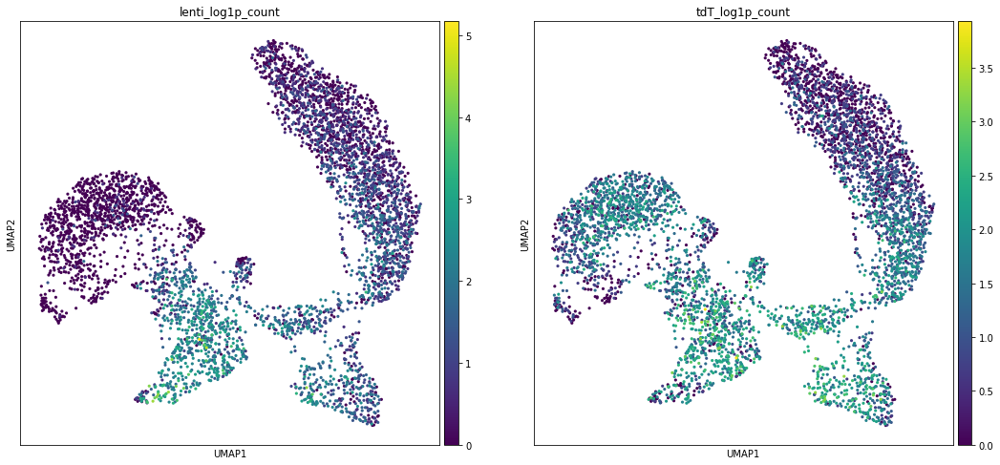

In [24]:
# Visualize lentivirus expression levels
# Figure 4B
sc.pl.umap(adata_experiment_neural, color=['lenti_log1p_count', 'tdT_log1p_count'], size=40,
#          save='_Experimental_lenti_tdT_log1p.pdf'
          )

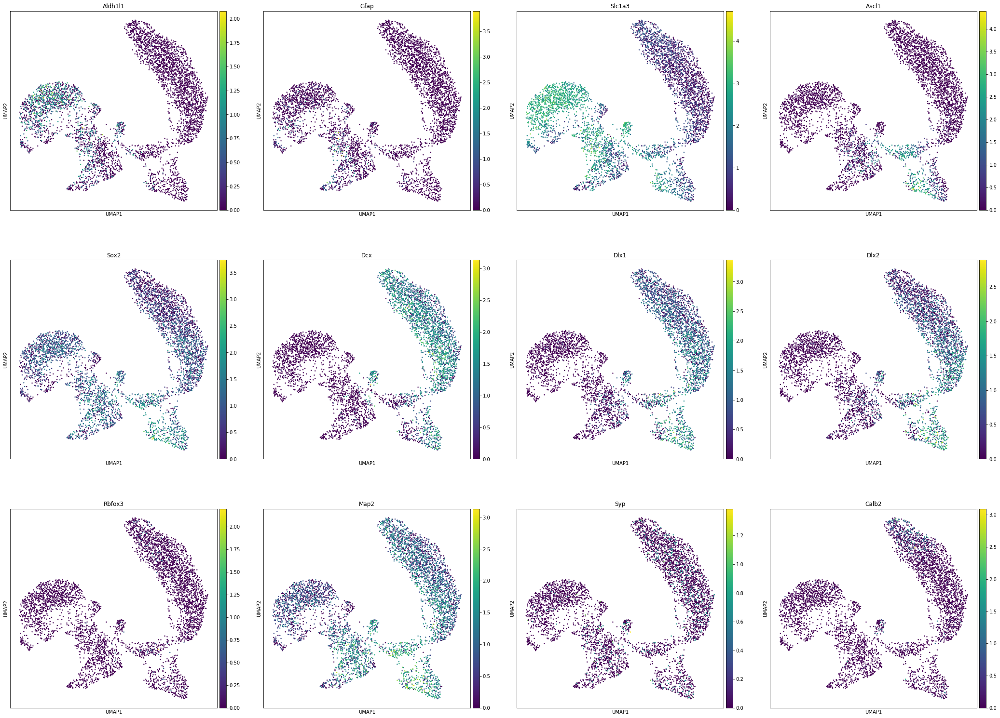

In [25]:
sc.pl.umap(adata_experiment_neural, color=['Aldh1l1', 'Gfap', 'Slc1a3', # Astrocyte markers
#                                           'Cspg4', 'Pdgfra', # NG2 and PDGFRA are NG2-glia markers
#                                           'Olig1', 'Olig2', 'Mog', 'Mbp', # Oligodendrocyte markers
                                           'Ascl1', 'Sox2', # Neural stem/progenitor cells markers
                                           'Dcx', 'Dlx1', 'Dlx2', # Neuroblast marker
                                           'Rbfox3', 'Map2', 'Syp', # Mature neuron markers
                                           'Calb2'], # GABAergic neuron marker
                                           use_raw=True) 

### 2.3 Assign cell type labels to clusters

In [27]:
# Summarizing the findings: 
adata_experiment_neural.rename_categories('louvain', ['Resident astrocytes-1', 'Early neuroblasts', 
                                                      'Late neuroblasts', 'Lenti-astrocytes-2', 
                                                      'Mid neuroblasts-2', 'Mid neuroblasts-1',
                                                      'Mitotic NPCs', 'Resident astrocytes-2', 
                                                      'Lenti-astrocytes-1', 'Non-mitotic NPCs', 
                                                      'Astro-neuroblast hybrid cells'])

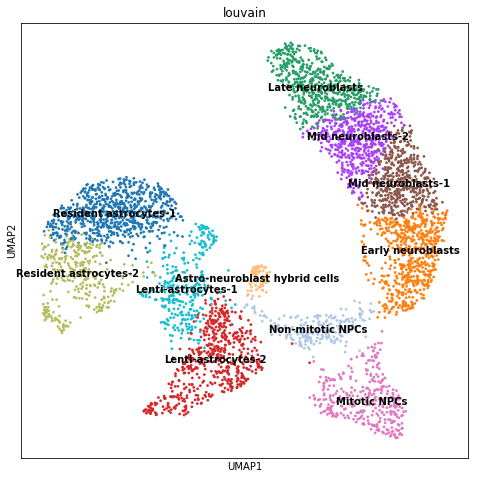

In [28]:
# Figure 4A
sc.pl.umap(adata_experiment_neural, color='louvain', legend_loc='on data', size=30, 
#          save='_Experimental_louvain.pdf'
          )

In [29]:
adata_experiment_neural.write(neural_data_dir + 'POv2_BL41-42Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno.h5ad')

### 2.4 Signature genes of each cluster

In [30]:
adata_experiment_neural = sc.read(neural_data_dir + 'POv2_BL41-42Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno.h5ad')

In [31]:
#Calculate marker genes
sc.tl.rank_genes_groups(adata_experiment_neural, groupby='louvain', key_added='rank_genes_r1.0') # Because the current resolution of Louvain clustering is 0.5

ranking genes
    finished: added to `.uns['rank_genes_r1.0']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


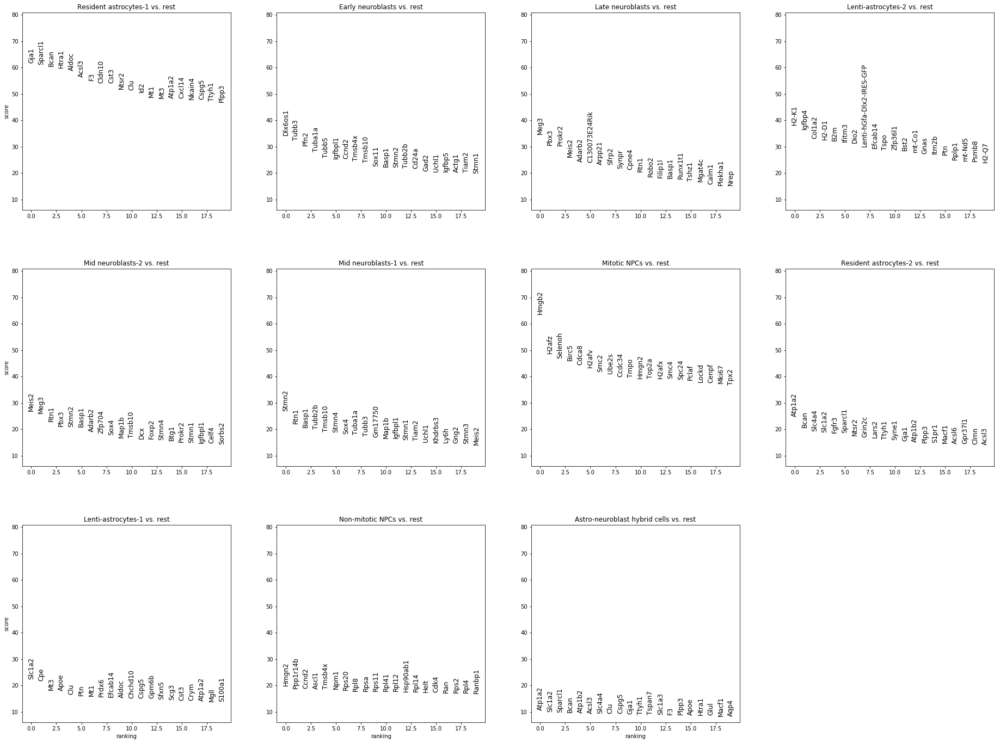

In [32]:
sc.pl.rank_genes_groups(adata_experiment_neural, key='rank_genes_r1.0', 
                        #groups=['0','1','2'],
                        fontsize=12)

In [33]:
pd.DataFrame(adata_experiment_neural.uns['rank_genes_r1.0']['names']).head()

,Resident astrocytes-1,Early neuroblasts,Late neuroblasts,Lenti-astrocytes-2,Mid neuroblasts-2,Mid neuroblasts-1,Mitotic NPCs,Resident astrocytes-2,Lenti-astrocytes-1,Non-mitotic NPCs,Astro-neuroblast hybrid cells
0,Gja1,Dlx6os1,Meg3,H2-K1,Meis2,Stmn2,Hmgb2,Atp1a2,Slc1a2,Hmgn2,Atp1a2
1,Sparcl1,Tubb3,Pbx3,Igfbp4,Meg3,Rtn1,H2afz,Bcan,Cpe,Ppp1r14b,Slc1a2
2,Bcan,Pfn2,Prokr2,Col1a2,Rtn1,Basp1,Selenoh,Slc4a4,Mt3,Ccnd2,Sparcl1
3,Htra1,Tuba1a,Meis2,H2-D1,Pbx3,Tubb2b,Birc5,Slc1a2,Apoe,Ascl1,Bcan
4,Aldoc,Tubb5,Adarb2,B2m,Stmn2,Tmsb10,Cdca8,Fgfr3,Clu,Tmsb4x,Atp1b2


In [34]:
DEG_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/DEGs/'

In [35]:
pd.DataFrame(adata_experiment_neural.uns['rank_genes_r1.0']['names']).head(100).to_csv(DEG_dir + 'POv2_SignatureGenes_NeuronalOnly_BL41-42Only.csv', index=False)

# 3 Pseudotime analysis

### 3.1 Remove control group cells

In [36]:
adata_experiment_neural = adata_experiment_neural[adata_experiment_neural.obs['library_name']=='BL41_reprogrammed']

In [37]:
adata_experiment_neural

View of AnnData object with n_obs × n_vars = 4601 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'n_counts'
    uns: 'library_name_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'paga', 'pca', 'umap', 'rank_genes_r1.0'
    obsm: 'Harmony', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

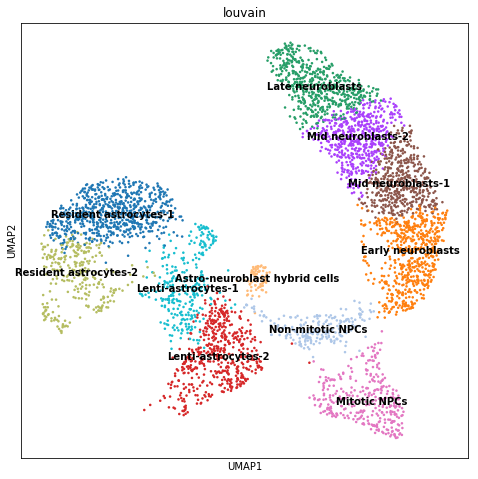

In [38]:
sc.pl.umap(adata_experiment_neural, color='louvain', legend_loc='on data')

In [39]:
adata_experiment_neural.write(neural_data_dir + 'POv2_BL41Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno.h5ad')

### 3.1 Calculate pseudotime using diffusion map (PAGA)

In [40]:
adata_experiment_neural = sc.read(neural_data_dir + 'POv2_BL41Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno.h5ad')

In [41]:
# Select a random cell from Resident astrocytes-1 as root for pseudotime
adata_experiment_neural.uns['iroot'] = np.flatnonzero(adata_experiment_neural.obs['louvain']  == 'Resident astrocytes-1')[0]

In [42]:
sc.tl.dpt(adata_experiment_neural)

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [ 1.          0.9984339   0.99457115  0.990691    0.982839    0.9810819
      0.978718    0.96939963  0.9655526   0.96073633  0.95414937  0.951982
      0.9487053   0.9484093  -0.97688544]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


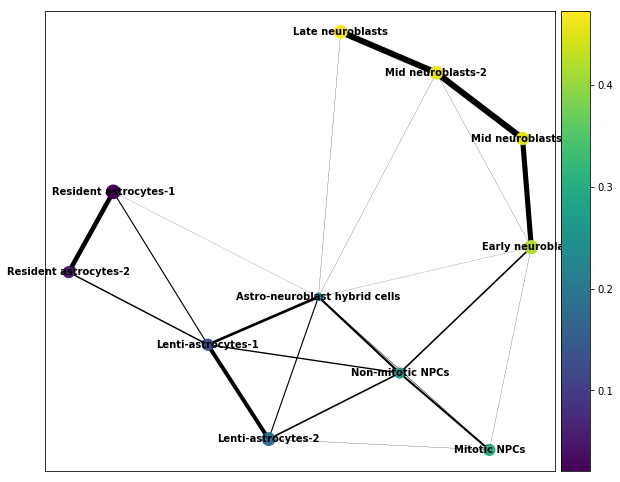

In [43]:
sc.pl.paga(adata_experiment_neural, color=['dpt_pseudotime'], use_raw=True)

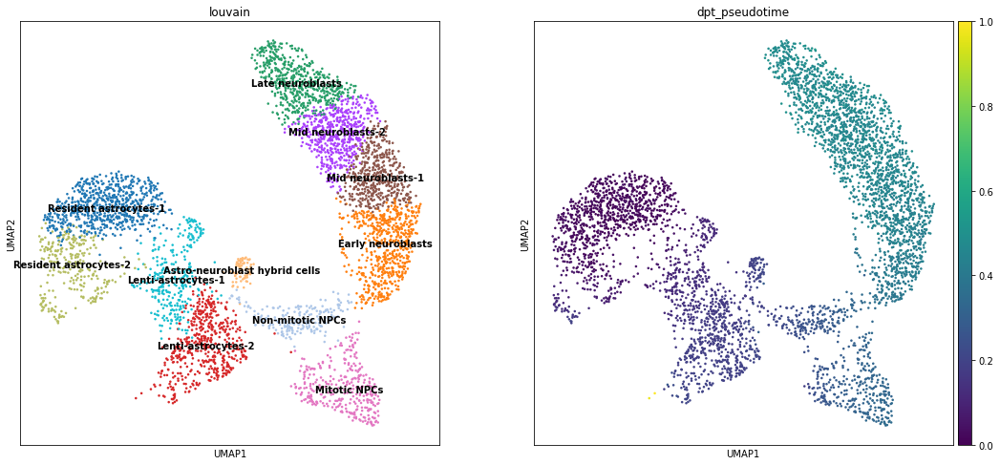

In [44]:
sc.pl.umap(adata_experiment_neural, color=['louvain', 'dpt_pseudotime'], legend_loc='on data')

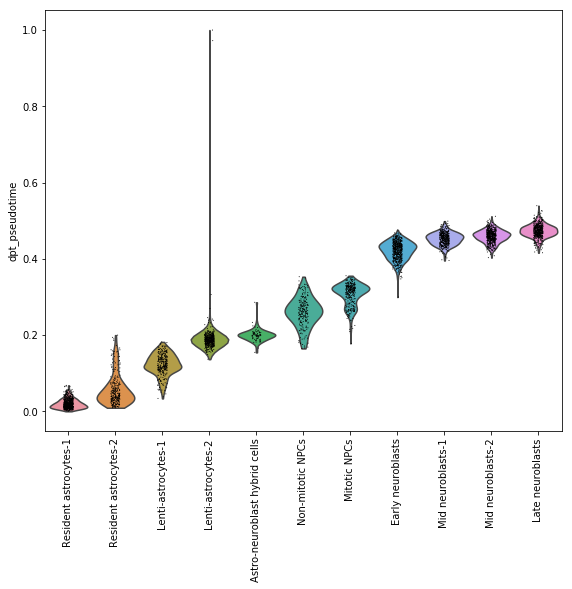

In [45]:
# Order and plot pseudotime across cell clusters
pseudotime_median = []
for cluster in adata_experiment_neural.obs['louvain'].cat.categories:
    pseudotime_median.append(adata_experiment_neural.obs['dpt_pseudotime'][adata_experiment_neural.obs['louvain']==cluster].median())

data = {'clusters': adata_experiment_neural.obs['louvain'].cat.categories, 'pseudotime_median': pseudotime_median}

pd_pseudotime = pd.DataFrame(data=data)

pd_pseudotime.sort_values(by='pseudotime_median', inplace=True)

sc.pl.violin(adata_experiment_neural, 'dpt_pseudotime', groupby='louvain', use_raw=True, rotation=90, order=pd_pseudotime['clusters'])

In [46]:
# Calculate ranks of pseudotime
array = np.array(adata_experiment_neural.obs['dpt_pseudotime'])

temp = array.argsort()

ranks = np.empty_like(temp)

ranks[temp] = np.arange(len(array))

adata_experiment_neural.obs['rank_pseudotime'] = ranks

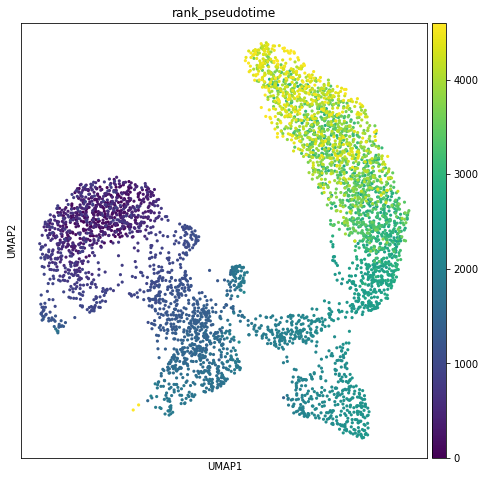

In [47]:
# Figure 4B
sc.pl.umap(adata_experiment_neural, color='rank_pseudotime', size=40, 
#          save='_BL41Only_rank_pseudotime.pdf'
          )

In [48]:
adata_experiment_neural.write(neural_data_dir + 'POv2_BL41Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno_pseudotime.h5ad')

### 3.2 Comfirm the expression patterns of known marker genes

In [12]:
adata_experiment_neural =sc.read(neural_data_dir + 'POv2_BL41Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno_pseudotime.h5ad')

In [13]:
# Genes from Dulken et al., 2017
genes_to_plot = ['Id3', 'Clu', 'Rpl32', 'Egfr', 'Cdk1', 'Ccna2', 'Mki67', 'Dlx1', 'Dlx2', 'Dcx', 'Dlx6os1']

In [14]:
# Rpl32 and Egfr have to be manually added to .obs. Otherwise, scanpy doesn't plot them correctly. 
gene = 'Rpl32'

adata_experiment_neural.obs[gene] = adata_experiment_neural.raw[:,gene].X

gene = 'Egfr'

adata_experiment_neural.obs[gene] = adata_experiment_neural.raw[:,gene].X

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


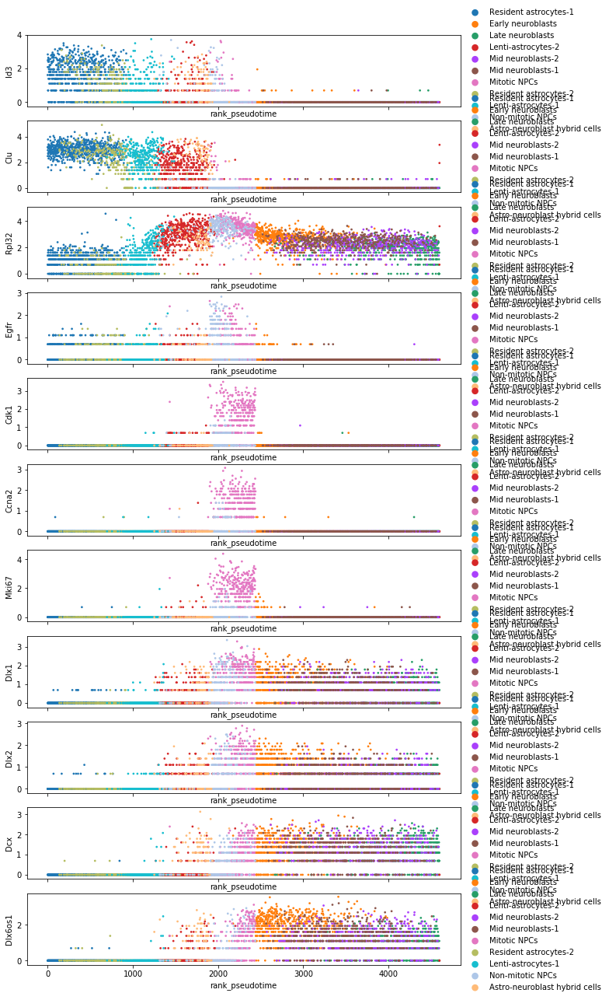

In [15]:
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(10,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_experiment_neural, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
# plt.savefig('./figures/scatter_Dulken_markers_pseudotime.pdf')

# Plot Yunjia's list of genes

In [16]:
# Genes from Dulken et al., 2017
genes_to_plot = ['Sox2', 'Bmp4', 'Bmp7', 'Smad4', 'Bmpr1a', 'Rbpj', 'Rest', 
                 'Rcor2', #CoREST
                 'Sin3a', 'Neurod4', 'Pten', 
                'Frzb' #SFRP3
                ]

In [17]:
for gene in genes_to_plot:
    print(gene in adata_experiment_neural.var_names)

True
False
False
False
False
False
False
False
False
False
False
False


In [20]:
for gene in genes_to_plot:
    print(gene in adata_experiment_neural.raw.var_names)

True
True
True
True
True
True
True
True
True
True
True
True


In [26]:
# Rpl32 and Egfr have to be manually added to .obs. Otherwise, scanpy doesn't plot them correctly. 
genes_to_add = genes_to_plot

for gene in genes_to_add:

    adata_experiment_neural.obs[gene] = adata_experiment_neural.raw[:,gene].X

# gene = 'Egfr'

# adata_experiment_neural.obs[gene] = adata_experiment_neural.raw[:,gene].X

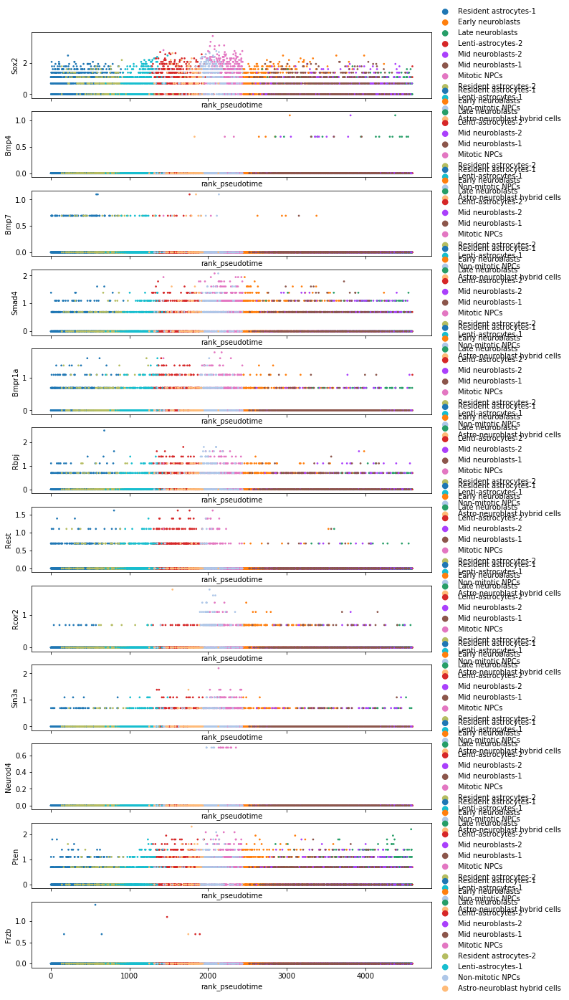

In [27]:
fig, axes = plt.subplots(nrows=len(genes_to_plot), ncols=1, figsize=(10,2*len(genes_to_plot)), sharex=True)
for i, gene in enumerate(genes_to_plot):
    sc.pl.scatter(adata_experiment_neural, x='rank_pseudotime', y=gene, color='louvain', use_raw=True, size=30, ax=axes[i], show=False, 
                 title='')
# plt.savefig('./figures/scatter_Dulken_markers_pseudotime.pdf')

# 4 Gene clustering

In [56]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess

In [57]:
from scipy.stats import chi2_contingency

In [58]:
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2)) 

### 4.1 Use chi-square test to filter genes

#### Load and prep raw count matrix

In [12]:
# Load BL41 and BL42 with 10X datasets (output file of cellranger count aggr)
adata = sc.read_10x_h5('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_with_10X/1.3M_brain_11_51/aggr_10x/outs/filtered_feature_bc_matrix.h5')

reading /project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/BL41-42_with_10X/1.3M_brain_11_51/aggr_10x/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:02)


In [13]:
# The combined dataset has 33145 cells, and 31055 genes
assert adata.X.shape == (33145, 31055)

In [14]:
adata = adata[adata_experiment_neural.obs.index,:]

In [15]:
adata.obs = adata_experiment_neural.obs

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [16]:
adata.var_names_make_unique()

In [17]:
adata

AnnData object with n_obs × n_vars = 4601 × 31055 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome'

In [18]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Remove genes expressed in < 50 (~1%) of the cells
sc.pp.filter_genes(adata, min_cells=50)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31055
filtered out 18796 genes that are detected in less than 50 cells
Number of genes after cell filter: 12259


#### Use chi-square test to remove genes not enriched in any cell cluster(s)
* i.e. genes that are (more or less) uniformly expressed across all clusters

In [19]:
cluster_size = adata.obs['louvain'].value_counts()

In [20]:
cluster_size.index

CategoricalIndex(['Resident astrocytes-1', 'Early neuroblasts',
                  'Mid neuroblasts-2', 'Late neuroblasts',
                  'Lenti-astrocytes-2', 'Mid neuroblasts-1', 'Mitotic NPCs',
                  'Lenti-astrocytes-1', 'Resident astrocytes-2',
                  'Non-mitotic NPCs', 'Astro-neuroblast hybrid cells'],
                 categories=['Resident astrocytes-1', 'Early neuroblasts', 'Late neuroblasts', 'Lenti-astrocytes-2', 'Mid neuroblasts-2', 'Mid neuroblasts-1', 'Mitotic NPCs', 'Resident astrocytes-2', ...], ordered=False, dtype='category')

In [21]:
# gene = adata.var.index[0]
df_tmp = pd.DataFrame(adata.obs['louvain'])
genes_keep = []
for gene in adata.var.index: 
    df_tmp['gene_expressed'] = adata[:,gene].X > 0
#    df_tmp['gene_expressed'] = adata[:,gene].X.toarray() > 0

#    df_tmp[df_tmp['gene_expressed']]['louvain'].value_counts()[expression_table.index]

    expression_table = pd.DataFrame(df_tmp[df_tmp['gene_expressed']]['louvain'].value_counts()[cluster_size.index])

    expression_table.columns = ['positive_cells']

    expression_table['negative_cells'] = cluster_size.values - expression_table['positive_cells']

    if expression_table['negative_cells'].sum() == 0:
        genes_keep.append((gene, 1)) 
        continue
#    expression_table

    # Make contigency table with the format:
    # [[queried cluster pos, rest clusters pos],
    #  [queried cluster neg, rest clusters neg]]
    # queried_cluster = '0'

    
    obs = np.array([expression_table['positive_cells'], expression_table['negative_cells']])

    _, p_val, _, _ = chi2_contingency(obs)

    p_val_adj = p_val * adata.X.shape[1]


#    if p_val_adj < 0.05:
#        genes_keep.append((gene, p_val_adj))
        
    genes_keep.append((gene, p_val_adj))

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


In [22]:
assert len(genes_keep)==12259

In [23]:
# Extract and organize result
keep_index = [gene for gene, p_val_adj in genes_keep]
p_values_adj = [p_val_adj for gene, p_val_adj in genes_keep]

chi_result = pd.DataFrame(data={'gene': keep_index, 'p_values_adj': p_values_adj})

chi_result['log10_p_values'] = np.log10(chi_result['p_values_adj'])

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/pandas/core/series.py:856: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [24]:
# for i in [-1.3, -2, -3, -4, -5, -6, -7, -8, -9, -10]:
for i in range(-5, -150, -5):
    print('{} genes have log10 p value less than {}.'.format(sum(chi_result['log10_p_values'] < i), i))

10427 genes have log10 p value less than -5.
9424 genes have log10 p value less than -10.
8590 genes have log10 p value less than -15.
7854 genes have log10 p value less than -20.
7208 genes have log10 p value less than -25.
6661 genes have log10 p value less than -30.
6111 genes have log10 p value less than -35.
5639 genes have log10 p value less than -40.
5231 genes have log10 p value less than -45.
4874 genes have log10 p value less than -50.
4524 genes have log10 p value less than -55.
4221 genes have log10 p value less than -60.
3955 genes have log10 p value less than -65.
3700 genes have log10 p value less than -70.
3451 genes have log10 p value less than -75.
3222 genes have log10 p value less than -80.
3018 genes have log10 p value less than -85.
2819 genes have log10 p value less than -90.
2637 genes have log10 p value less than -95.
2469 genes have log10 p value less than -100.
2332 genes have log10 p value less than -105.
2169 genes have log10 p value less than -110.
2035 ge

In [25]:
# Make a p-value cutoff 
adata = adata[:,chi_result['log10_p_values']<-100]

In [26]:
adata

View of AnnData object with n_obs × n_vars = 4601 × 2469 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'

### 4.2 Perform Louvain clustering on genes

#### Log-transform and scale genes across cells first

In [27]:
adata.var['p_val_adj'] = chi_result['p_values_adj'][chi_result['log10_p_values']<-100]

Trying to set attribute `.var` of view, making a copy.


In [28]:
#Keep the count data in a counts layer
adata.layers['counts'] = adata.X.copy()

In [29]:
# Natural log-transform the data
sc.pp.log1p(adata)

In [30]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

In [31]:
n_genes = adata.X.shape[1] # Keep all genes that passed 50 cell filter and are differentially enriched between cell clusters

sc.pp.recipe_zheng17(adata, n_top_genes = n_genes, log=False) # log=False as adata.X is already log-transformed

running recipe zheng17
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
    finished (0:00:00)


In [32]:
adata

AnnData object with n_obs × n_vars = 4601 × 2469 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'p_val_adj', 'n_counts'
    uns: 'log1p'
    layers: 'counts'

#### Make an AnnData object for genes as rows, and perform clustering

In [33]:
# Construct a new AnnData

# Genes are on rows, and cells on columns
adata_genes = anndata.AnnData(X=adata.X.T, 
                             obs=adata.var, 
                             var=adata.obs)

In [34]:
adata_genes

AnnData object with n_obs × n_vars = 2469 × 4601 
    obs: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'p_val_adj', 'n_counts'
    var: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime'

In [35]:
# Calculate how many BL neural cells (5056 total) express each gene; a useful metric downstream
adata_genes.obs['n_cells_experimental'] = (adata_genes.X>0).sum(axis=1)

computing PCA with n_comps = 50
    finished (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


... storing 'feature_types' as categorical
... storing 'genome' as categorical


running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


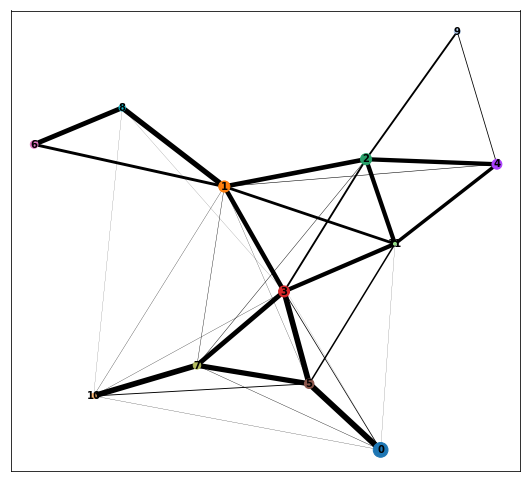

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [36]:
# Perform PCA and Louvain clustering for the ~2500 genes
sc.tl.pca(adata_genes, n_comps=50)

sc.pp.neighbors(
    adata_genes,
    use_rep='X_pca',  
#    use_rep='Harmony',  
#    random_state=random_seed
)

sc.tl.louvain(
    adata_genes,
#    resolution=0.50,
#   resolution=0.70,
    resolution=1.00,
#    resolution=1.50,
    #    random_state=random_seed
)

sc.tl.paga(
    adata_genes,
    groups='louvain',  
)

sc.pl.paga(
    adata_genes, 
    color=['louvain'], 
    use_raw=True,
#    use_raw=False,
#    layout='fa', 
    layout='fr', 
    threshold=0.01, 
    node_size_scale=0.5,
    node_size_power=0.9, 
#    random_state=random_seed, 
)

sc.tl.umap(
    adata_genes,
    init_pos='paga', 
#    random_state=random_seed,
)

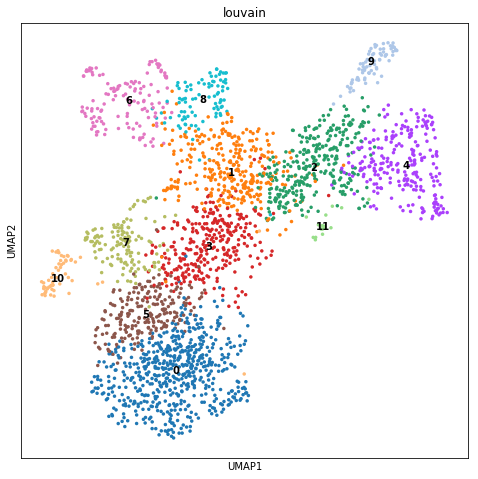

In [37]:
# Plot the genes in UMAP space
sc.pl.umap(adata_genes, color='louvain', legend_loc='on data')

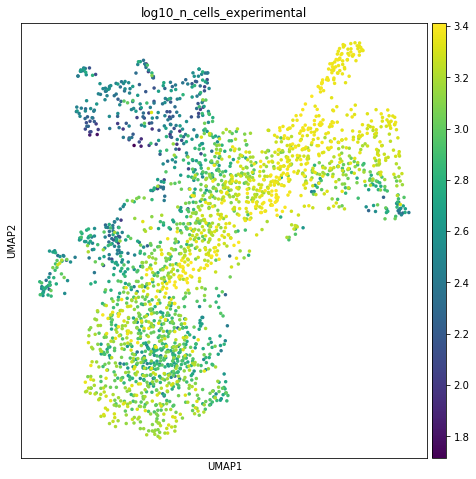

In [38]:
# Genes colored by in how many cells they are expressed
adata_genes.obs['log10_n_cells_experimental'] = np.log10(adata_genes.obs['n_cells_experimental'] + 1)
sc.pl.umap(adata_genes, color='log10_n_cells_experimental')

In [39]:
# How many genes are in each cluster? 
louvain_clusters_counter = adata_genes.obs['louvain'].value_counts()
louvain_clusters_counter

0     582
1     313
2     309
3     302
4     240
5     218
6     135
7     131
8      91
9      76
10     56
11     16
Name: louvain, dtype: int64

### 4.3 Characterize gene clusters

#### Visualize mean expr of each gene cluster on UMAP

In [40]:
adata_neural_tmp = adata_experiment_neural.copy()

In [41]:
# Calculate geometric mean (in form of log1p-transformed read counts) for each cluster of genes
for i in range(len(louvain_clusters_counter)):
    n_cluster_gene = str(i)
    cluster_gene_index = adata_genes.obs[adata_genes.obs['louvain'] == n_cluster_gene].index
    adata_neural_tmp.obs['louvain_cluster_'+n_cluster_gene+'_gene_log_mean'] = adata.raw[:, cluster_gene_index.tolist()].X.sum(axis=1)/louvain_clusters_counter[i]
    adata_neural_tmp.obs['louvain_cluster_'+n_cluster_gene+'_gene_scaled_mean'] = adata[:, cluster_gene_index.tolist()].X.sum(axis=1)/louvain_clusters_counter[i]

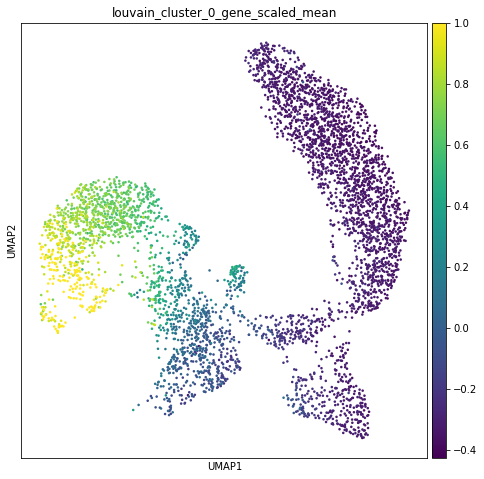

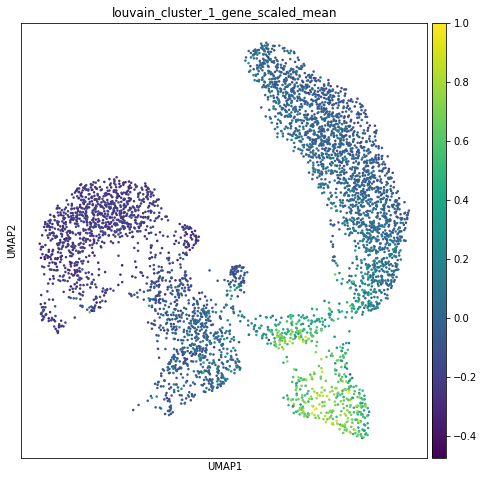

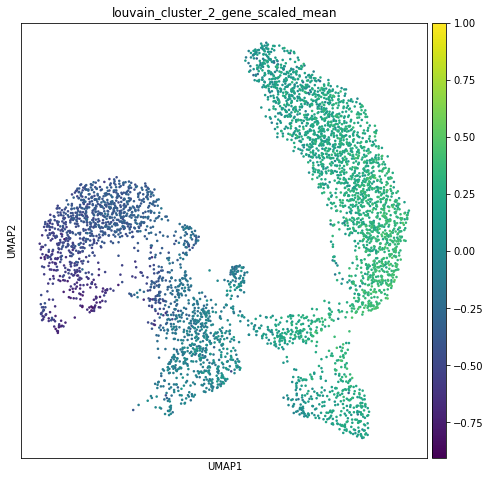

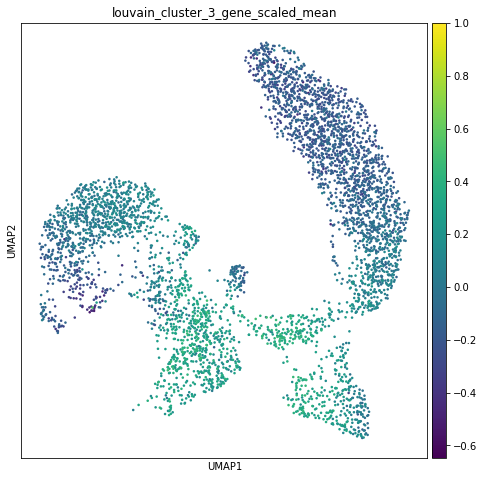

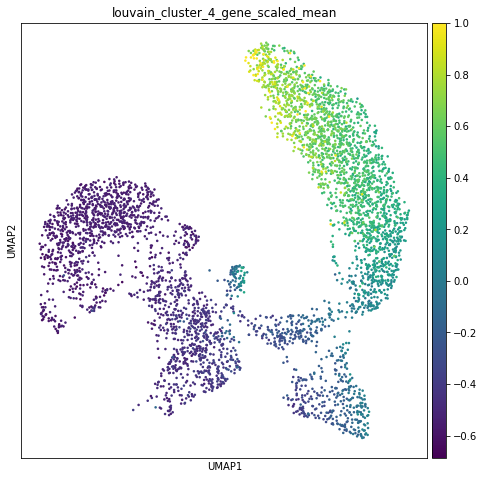

...

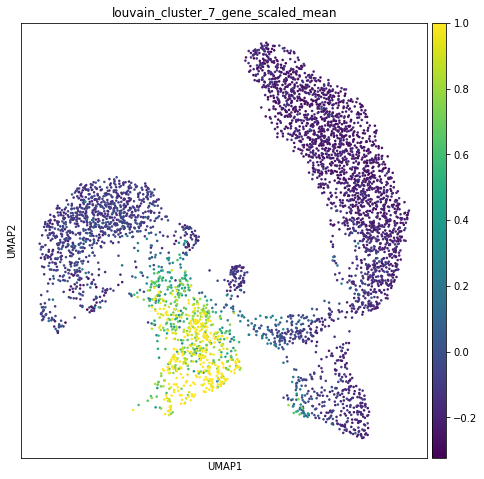

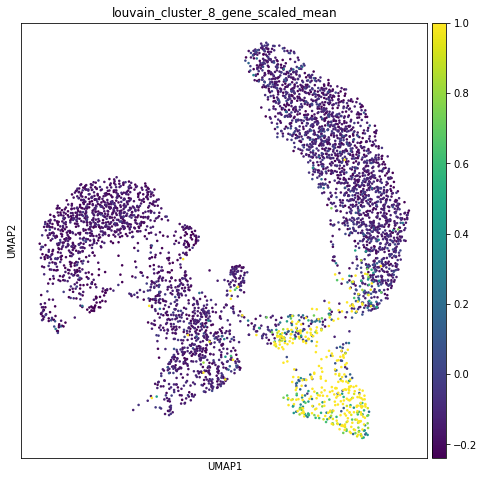

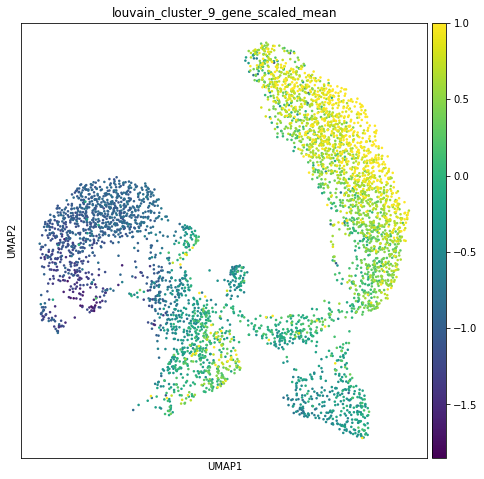

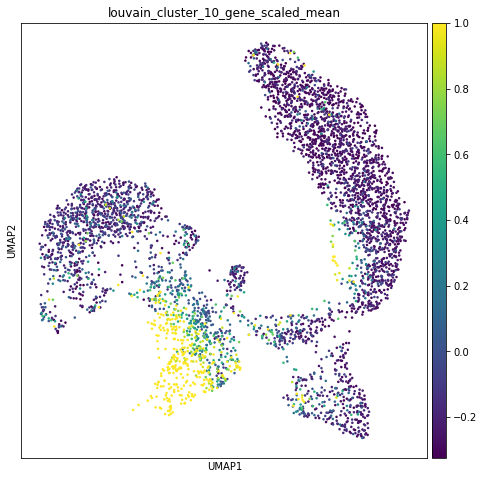

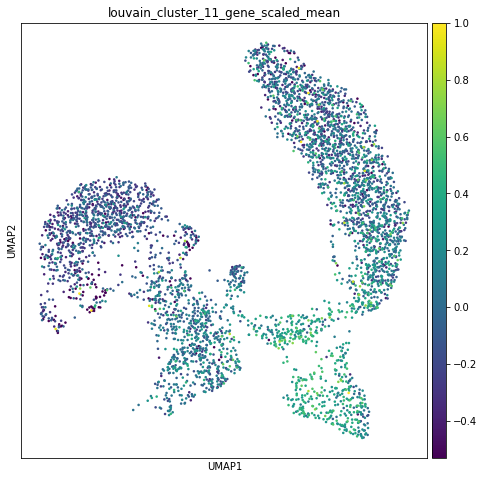

In [42]:
# Plot the scaled mean of each gene cluster on the original lenti-DLX2 neural cell map
for n_cluster_gene in range(len(louvain_clusters_counter)):
    n_cluster_gene = str(n_cluster_gene)
    sc.pl.umap(adata_neural_tmp, color='louvain_cluster_'+n_cluster_gene+'_gene_scaled_mean', vmax=1.0)

#### Visualize mean expr of each gene cluster along pseudotime

In [43]:
adata_genes.obs['louvain'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11'], dtype='object')

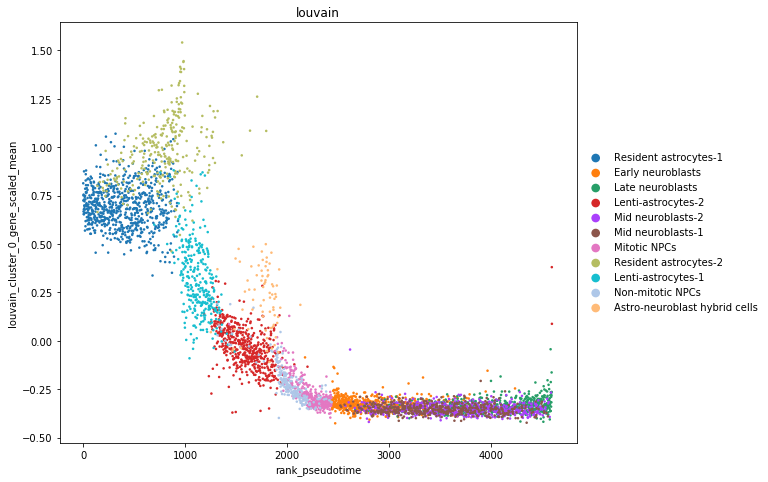

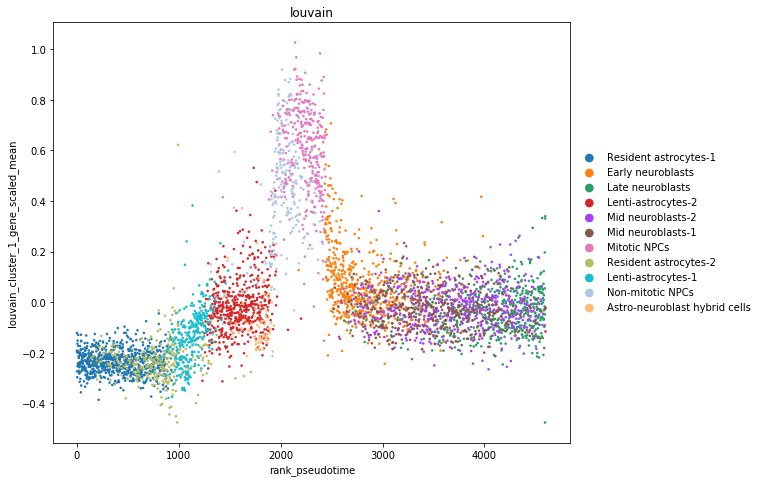

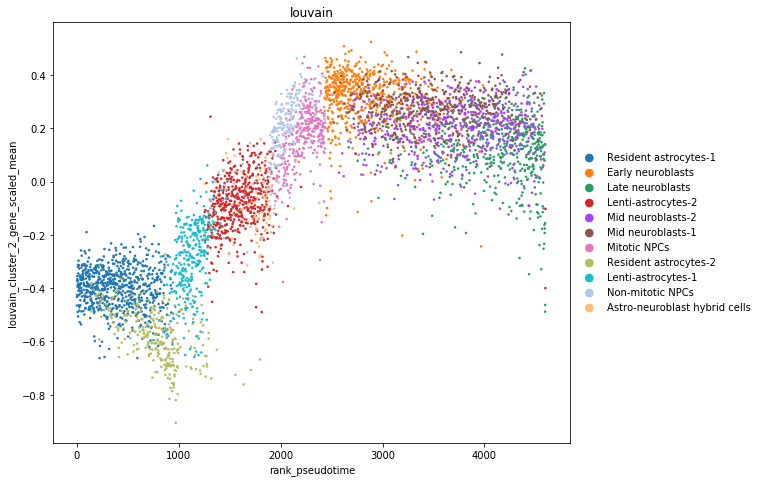

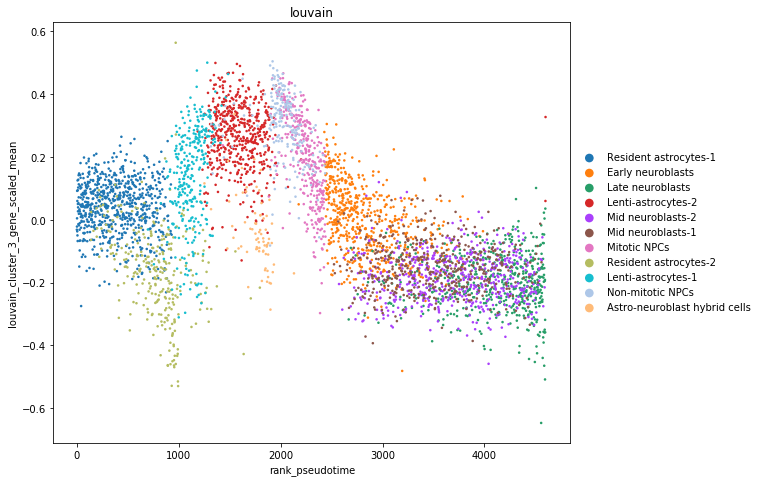

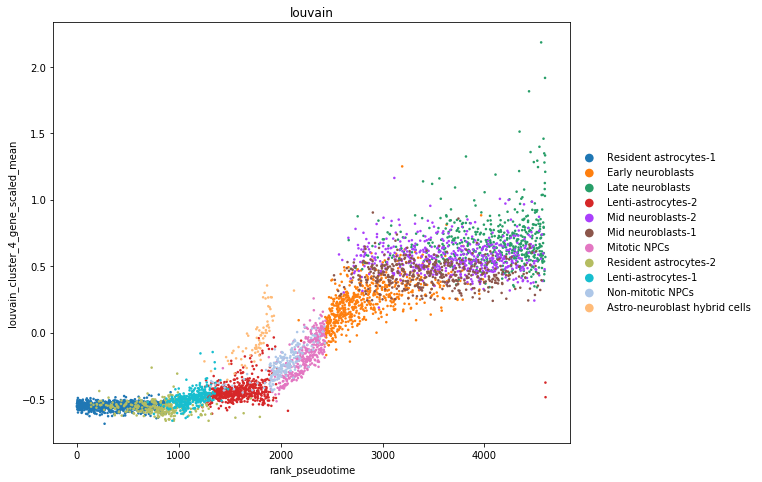

...

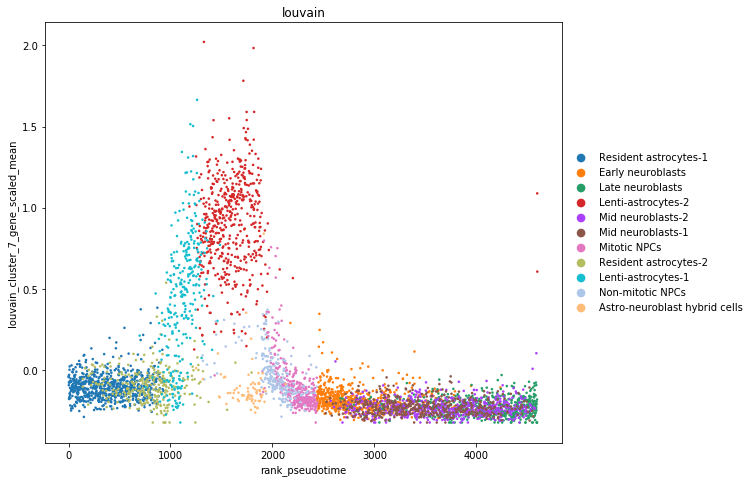

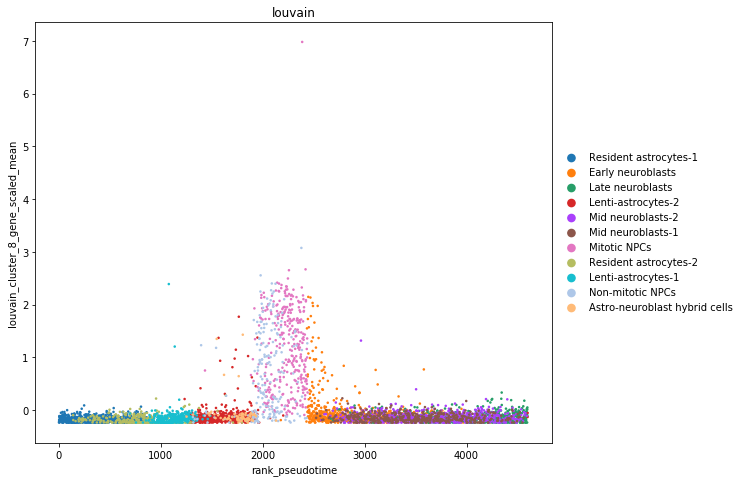

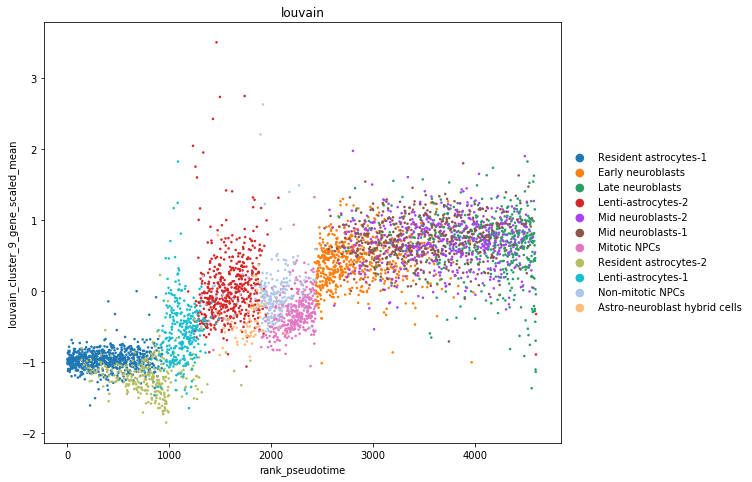

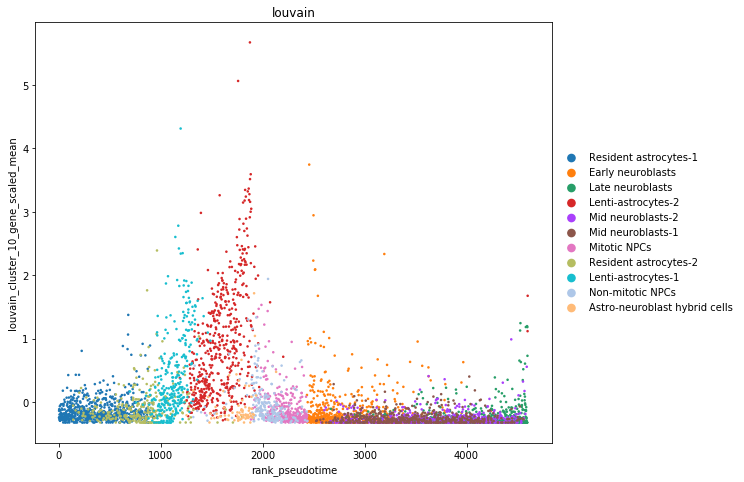

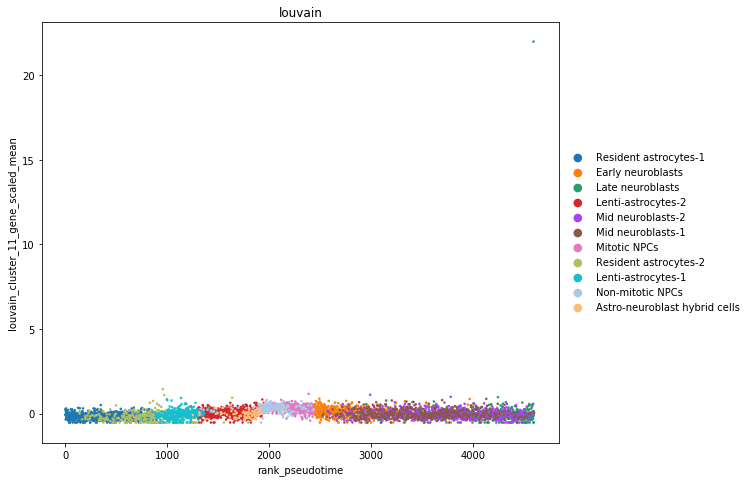

In [44]:
for n_cluster_gene in adata_genes.obs['louvain'].cat.categories:
#    n_cluster_gene = str(n_cluster_gene)
    sc.pl.scatter(adata_neural_tmp, x='rank_pseudotime', y='louvain_cluster_'+n_cluster_gene+'_gene_scaled_mean', color='louvain', use_raw=True, 
             #save='_mainTraj_Egfr_alongPseudotime.pdf'
             )

#### Calculate LOESS curves for each cluster

##### With scaled mean

In [120]:
gene_louvain_scaled_mean_loess = []
for n_cluster_gene in adata_genes.obs['louvain'].cat.categories:
#    n_cluster_gene = str(i)
    x = adata_neural_tmp.obs['rank_pseudotime']
    y = adata_neural_tmp.obs['louvain_cluster_'+n_cluster_gene+'_gene_scaled_mean']

    gene_louvain_scaled_mean_loess.append(lowess(y, x, frac=0.2)) 

In [13]:
python_dir = data_dir + 'Python_objects/'

In [122]:
output_path = python_dir + 'gene_louvain_scaled_mean_loess_Manuscript_v2'

with open(output_path, 'wb') as output_file:
 
    pickle.dump(gene_louvain_scaled_mean_loess, output_file)

In [14]:
input_path = python_dir + 'gene_louvain_scaled_mean_loess_Manuscript_v2'
with open(input_path, 'rb') as input_file:
 
    gene_louvain_scaled_mean_loess = pickle.load(input_file)

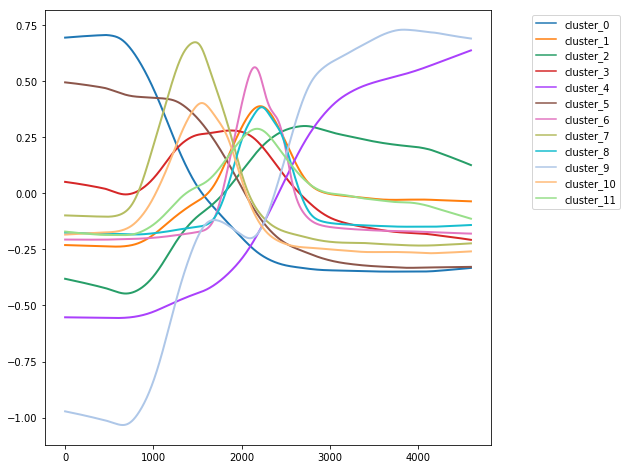

In [48]:
# Figure 4C
handles = []
for i in range(len(adata_genes.obs['louvain'].cat.categories)): 
#    print('Current cluster is: {}'.format(i))
    clr = adata_genes.uns['louvain_colors'][i]
    plt.plot(gene_louvain_scaled_mean_loess[i][:,0], gene_louvain_scaled_mean_loess[i][:,1], 
             clr,
             alpha=1, 
             linestyle='-', 
             linewidth=2
            )
    handles.append(mpl.lines.Line2D([], [], color=clr, linestyle='-', label='cluster_'+str(i)))

plt.legend(handles=handles, loc='upper right', bbox_to_anchor=(1.3, 1))
    
# plt.legend()
# plt.savefig('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2/Figure2/linechart_loess_gene_clusters.pdf')
plt.show()    

#### Plot heatmap for gene cluster expression in cell clusters

In [50]:
adata_neural_tmp

AnnData object with n_obs × n_vars = 4601 × 2499 
    obs: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime', 'louvain_cluster_0_gene_log_mean', 'louvain_cluster_0_gene_scaled_mean', 'louvain_cluster_1_gene_log_mean', 'louvain_cluster_1_gene_scaled_mean', 'louvain_cluster_2_gene_log_mean', 'louvain_cluster_2_gene_scaled_mean', 'louvain_cluster_3_gene_log_mean', 'louvain_cluster_3_gene_scaled_mean', 'louvain_cluster_4_gene_log_mean', 'louvain_cluster_4_gene_scaled_mean', 'louvain_cluster_5_gene_log_mean', 'louvain_cluster_5_gene_scaled_mean', 'louvain_cluster_6_gene_log_mean', 'louvain_cluster_6_gene_scaled_mean', 'louvain_cluster_7_gene_log_mean', 'louvain_cluster_7_gene_scaled_mean', 'louvain_cluster_8_gene_log_mean', 'louvain_cluster_8_gene_scaled_mean', 'louvain_cluster_9_gene_log_mean', 'louvain_cluster_9_gene_scaled_m

In [51]:
gene_cluster_activity = pd.DataFrame(index=adata_genes.obs['louvain'].cat.categories)
for cluster in adata_neural_tmp.obs['louvain'].cat.categories:
#    cluster = 'Astrocytes-resident1'

    cell_index = adata_neural_tmp.obs.index[adata_neural_tmp.obs['louvain']==cluster]

    col_index = []
    for gene_cluster in gene_cluster_activity.index:
        col_index.append('louvain_cluster_'+gene_cluster+'_gene_scaled_mean')

    df_cluster = adata_neural_tmp.obs.loc[cell_index, col_index]

    gene_cluster_activity[cluster] = df_cluster.mean(axis=0).values

In [52]:
gene_cluster_activity.index = col_index

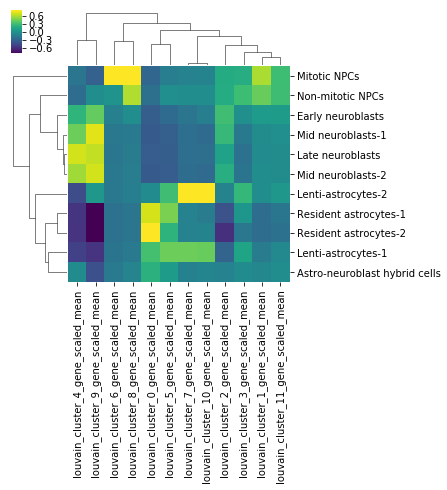

In [53]:
# Figure S4D
g = sns.clustermap(gene_cluster_activity.T, 
                    row_cluster=True, 
                    col_cluster=True, 
#                     row_colors=gene_color,
#                     col_colors=[cell_louvain_color,cell_rank_color],
                    cmap='viridis',
                    figsize=(5,5),
                    vmin=-0.8, 
                    vmax=0.8, 
#                     xticklabels=False, 
#                     yticklabels=yticklabels, 
                    rasterized=True )


#plt.savefig('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2/Heatmap_gene_cluster_means_rasterized.pdf', 
#           dpi=600)

#### Print each cluster into csv

In [54]:
for cluster in adata_genes.obs['louvain'].cat.categories:
    gene_index = adata_genes.obs.index[adata_genes.obs['louvain']==cluster].tolist()
    df_cluster = pd.DataFrame(data={'genes': gene_index})
    df_cluster.to_csv('POv2_cluster'+cluster+'_genes.csv')

#### Save the data

In [15]:
gene_data_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/Cluster_with_10X_20k/data/10x_remapped/PipelineOrganized_v1/Gene_clusters/'

In [187]:
adata_neural_tmp.write(gene_data_dir + 'adata_neural_BLOnly_geneClusters_Manuscript_v2.h5ad')

In [16]:
adata_neural_tmp = sc.read(gene_data_dir + 'adata_neural_BLOnly_geneClusters_Manuscript_v2.h5ad' )

In [189]:
output_path = gene_data_dir + 'adata_genes_Manuscript_v2'

with open(output_path, 'wb') as output_file:
 
    pickle.dump(adata_genes, output_file)

In [17]:
input_path = gene_data_dir + 'adata_genes_Manuscript_v2'
with open(input_path, 'rb') as input_file:
 
    adata_genes = pickle.load(input_file)

In [18]:
adata_genes

AnnData object with n_obs × n_vars = 2469 × 4601 
    obs: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'p_val_adj', 'n_counts', 'n_cells_experimental', 'louvain', 'log10_n_cells_experimental'
    var: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime', 'Rpl32', 'Egfr'
    uns: 'pca', 'neighbors', 'louvain', 'paga', 'louvain_sizes', 'louvain_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

### 4.4 Plot heatmap for individual genes

In [19]:
adata_genes

AnnData object with n_obs × n_vars = 2469 × 4601 
    obs: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'p_val_adj', 'n_counts', 'n_cells_experimental', 'louvain', 'log10_n_cells_experimental'
    var: 'library_name', 'batch', 'lenti_count', 'lenti_log1p_count', 'tdT_count', 'tdT_log1p_count', 'n_counts', 'log_counts', 'n_genes', 'mt_count', 'mt_frac', 'n_counts_all', 'louvain', 'dpt_pseudotime', 'rank_pseudotime', 'Rpl32', 'Egfr'
    uns: 'pca', 'neighbors', 'louvain', 'paga', 'louvain_sizes', 'louvain_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

##### Calculate cell order (based on pseudotime)

In [20]:
cell_order = pd.DataFrame(adata_genes.var['rank_pseudotime'])

cell_order['order'] = range(cell_order.shape[0])

cell_order.sort_values(by='rank_pseudotime', axis=0, ascending=True, inplace=True)

##### Calculate gene order (based on cluster and expression timing)

In [21]:
python_dir = data_dir + 'Python_objects/'

In [22]:
input_path = python_dir + 'gene_louvain_scaled_mean_loess_Manuscript_v2'
with open(input_path, 'rb') as input_file:
 
    gene_louvain_scaled_mean_loess = pickle.load(input_file)

In [24]:
max_pos = []
for loess in gene_louvain_scaled_mean_loess:
    max_pos.append(loess[:,0][np.where(loess[:,1] == loess[:,1].max(), True, False)][0])

In [25]:
cluster_order = pd.DataFrame({'max_pos': max_pos})

cluster_order.sort_values(by='max_pos', axis=0, ascending=True, inplace=True)

In [26]:
gene_order = []
# for n_cluster in adata_genes.obs['louvain'].unique():
# for n_cluster in [str(i) for i in range(10)]:
for n_cluster in [str(i) for i in cluster_order.index]:
    for gene in adata_genes.obs.index[adata_genes.obs['louvain']==n_cluster]:
        gene_order.append(adata_genes.obs.index.get_loc(gene))

##### Make color vectors for genes (rows) and cells (columns) so that they match their corresponding Louvain colors

In [28]:
gene_color = []
for gene_louvain in adata_genes.obs.iloc[gene_order]['louvain']:
    gene_color.append(adata_genes.uns['louvain_colors'][int(gene_louvain)])

In [30]:
cell_louvain_color = []
for cell_louvain in adata_genes.var['louvain'][cell_order['order'].tolist()]:
    index = adata_neural_tmp.obs['louvain'].cat.categories.get_loc(cell_louvain)
    cell_louvain_color.append(adata_neural_tmp.uns['louvain_colors'][index])

In [32]:
cell_rank_color = sns.color_palette('YlOrBr', n_colors=adata_genes.var.shape[0])

In [33]:
genes_in_order = adata_genes[gene_order, :].obs.index.tolist()

In [34]:
genes_to_label = ['Aldh1l1', 'Clu', 'Id3', 'Rpl32', 'Ascl1', 'Cdk1', 'Mki67', 'Ccna2', 'Dlx1', 'Dlx2', 'Dcx', 'Dlx6os1', 'Calb2']

In [35]:
yticklabels = []
for gene in genes_in_order:
    if gene in genes_to_label:
        yticklabels.append(gene)
    else:
        yticklabels.append('')

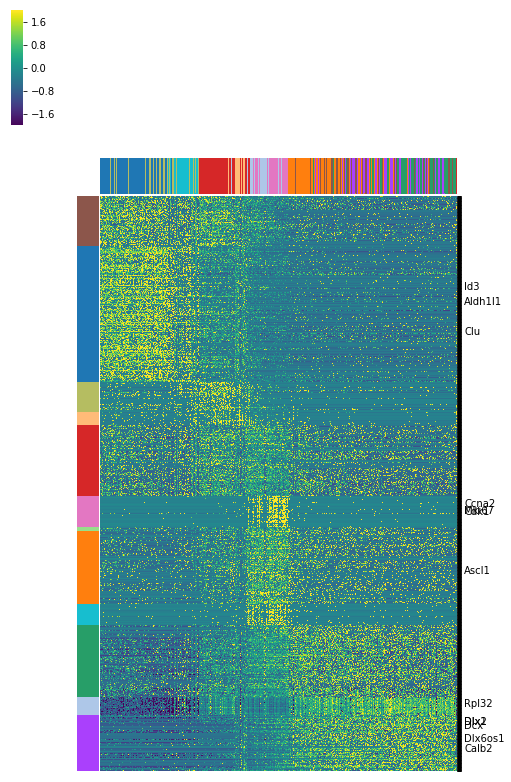

In [36]:
# Figure 4D
g = sns.clustermap(adata_genes.X[gene_order, :][:, cell_order['order'].tolist()], 
                    row_cluster=False, 
                    col_cluster=False, 
                    row_colors=gene_color,
#                    col_colors=[cell_louvain_color,cell_rank_color],
                    col_colors=cell_louvain_color,
                    cmap='viridis',
                    figsize=(8,14),
                    vmin=-2, 
                    vmax=2, 
                    xticklabels=False, 
                    yticklabels=yticklabels, 
                    rasterized=True)

# plt.savefig('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2/Figure2/Heatmap_gene_clusters_rasterized.pdf',
# dpi=400)

### 4.5 Validate gene clusters

#### Overlap with Lindtner et al., 2019

#### 4.5.1 DEGs

In [37]:
Lindtner_genes = pd.read_csv('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/10.Comparison_w_Lindtner2019/DE_genes/DE_genes_Lindtner2019.csv')

In [38]:
down_genes = Lindtner_genes['Gene'][(Lindtner_genes['logFC'] < 0).tolist()].tolist()

In [39]:
up_genes = Lindtner_genes['Gene'][(Lindtner_genes['logFC'] > 0).tolist()].tolist()

#### Down genes

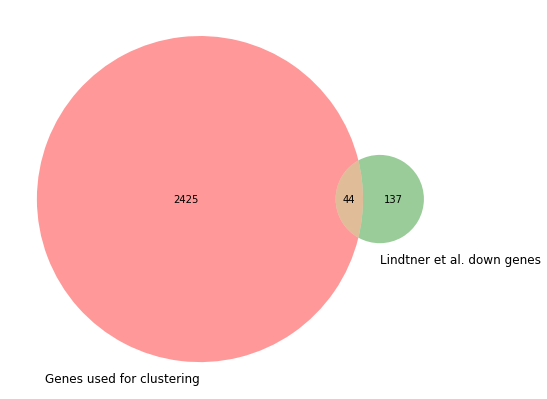

In [40]:
AB = len(intersection(down_genes, adata_genes.obs.index))
overlap = AB

Ab = len(adata_genes.obs.index) - AB
aB = len(down_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Genes used for clustering', 
                        'Lindtner et al. down genes'))

Cluster 4 is significantly enriched in down genes
Adjusted p value is 6.675936037282257e-22
['Gm13889', 'S100a10', 'Elmo1', 'Erbb4', 'Dlx5', 'Bcl11a', 'Nrxn3', 'Gad1', 'Sp8', 'Dlx1', 'Dpp10', 'Arx', 'Slc32a1', 'Mgat4c', 'Robo2', 'Dlx2', 'Zeb2', 'Adarb2', 'Abracl', 'Dlx6os1', 'Gad2', 'Enox1', 'Mpped2', 'Tiam2']


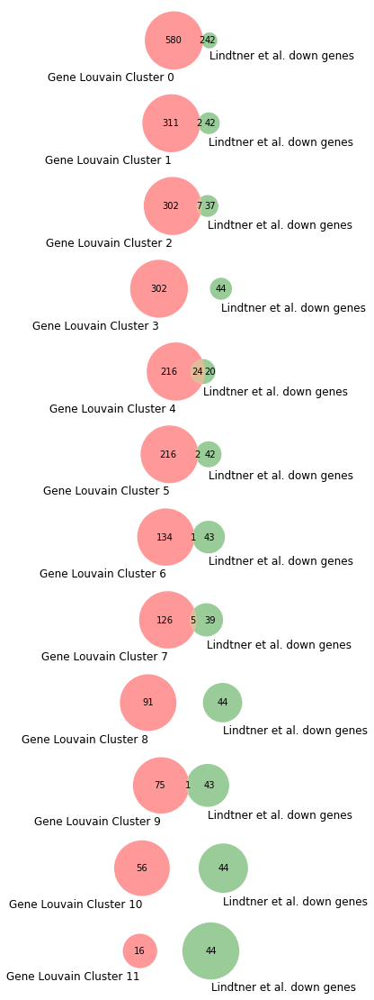

In [41]:
# Overlap with down genes (in Dlx1-Dlx2-)
figure, axes = plt.subplots(len(adata_genes.obs['louvain'].cat.categories), figsize=(140, 20))

for i, n_cluster in enumerate(adata_genes.obs['louvain'].cat.categories):

    louvain_query_genes = [gene for gene in adata_genes.obs.index if adata_genes.obs['louvain'][gene] == n_cluster]

    AB = len(intersection(louvain_query_genes, down_genes))
#     print(intersection(louvain_query_genes, down_genes))

    Ab = len(louvain_query_genes) - AB

    aB = overlap - AB

    p = venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Gene Louvain Cluster {}'.format(n_cluster), 
                        'Lindtner et al. down genes'), 
              ax=axes[i])
    

        # Make contigency table with the format:
    # [[queried cluster pos, rest clusters pos],
    #  [queried cluster neg, rest clusters neg]]
    # queried_cluster = '0'

    
    obs = np.array([[AB, aB], [Ab, adata_genes.X.shape[0] - AB - aB - Ab]])

    _, p_val, _, _ = chi2_contingency(obs)

    p_val_adj = p_val * len(adata_genes.obs['louvain'].cat.categories)
    
    direction_test = AB/Ab > aB/(adata_genes.X.shape[0] - AB - aB - Ab)

    if p_val_adj < 0.05:
#    if p_val < 0.05:
        if direction_test:
            print('Cluster', n_cluster, 'is significantly enriched in down genes')
        else: 
            print('Cluster', n_cluster, 'is significantly depleted of down genes')
        print('Adjusted p value is {}'.format(p_val_adj))
#        print('P value is {}'.format(p_val))
        print(intersection(louvain_query_genes, down_genes))
    
plt.show()

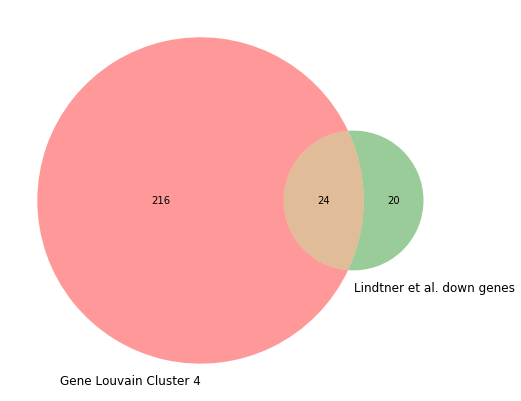

In [42]:
# Figure S4E
louvain_query_genes = [gene for gene in adata_genes.obs.index if adata_genes.obs['louvain'][gene] == '4']

AB = len(intersection(louvain_query_genes, down_genes))

Ab = len(louvain_query_genes) - AB

aB = overlap - AB

p = venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Gene Louvain Cluster {}'.format(4), 
                        'Lindtner et al. down genes'), 
#              ax=axes[i]
         )
# plt.savefig('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Figures_v2/Venn_cluster4_Lindtner_down.pdf', 
#            dpi=600)

#### Up genes

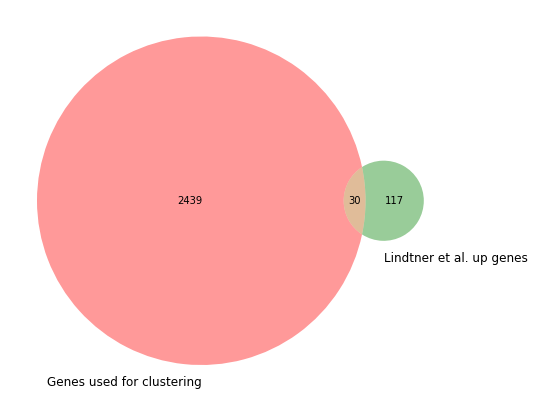

In [178]:
AB = len(intersection(up_genes, adata_genes.obs.index))
overlap = AB

Ab = len(adata_genes.obs.index) - AB
aB = len(up_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Genes used for clustering', 
                        'Lindtner et al. up genes'))

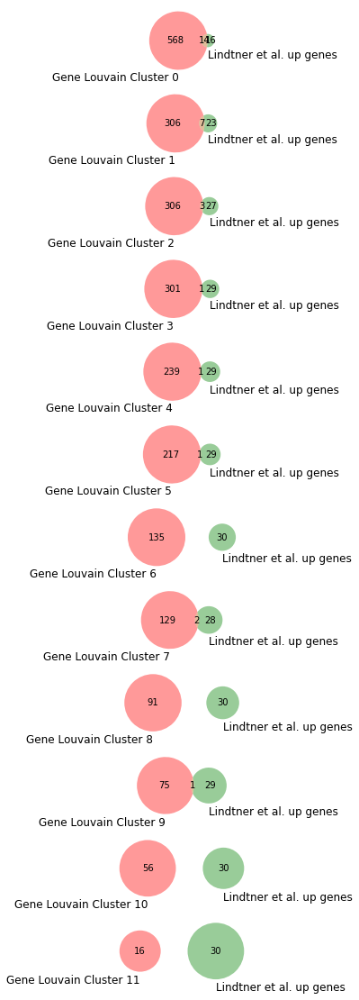

In [179]:
# Overlap with down genes (in Dlx1-Dlx2-)
figure, axes = plt.subplots(len(adata_genes.obs['louvain'].cat.categories), figsize=(140, 20))

for i, n_cluster in enumerate(adata_genes.obs['louvain'].cat.categories):

    louvain_query_genes = [gene for gene in adata_genes.obs.index if adata_genes.obs['louvain'][gene] == n_cluster]

    AB = len(intersection(louvain_query_genes, up_genes))
#     print(intersection(louvain_query_genes, down_genes))

    Ab = len(louvain_query_genes) - AB

    aB = overlap - AB

    p = venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Gene Louvain Cluster {}'.format(n_cluster), 
                        'Lindtner et al. up genes'), 
              ax=axes[i])
    

        # Make contigency table with the format:
    # [[queried cluster pos, rest clusters pos],
    #  [queried cluster neg, rest clusters neg]]
    # queried_cluster = '0'

    
    obs = np.array([[AB, aB], [Ab, adata_genes.X.shape[0] - AB - aB - Ab]])

    _, p_val, _, _ = chi2_contingency(obs)

    p_val_adj = p_val * len(adata_genes.obs['louvain'].cat.categories)
    
    direction_test = AB/Ab > aB/(adata_genes.X.shape[0] - AB - aB - Ab)

    if p_val_adj < 0.05:
#    if p_val < 0.05:
        if direction_test:
            print('Cluster', n_cluster, 'is significantly enriched in up genes')
        else: 
            print('Cluster', n_cluster, 'is significantly depleted of up genes')
        print('Adjusted p value is {}'.format(p_val_adj))
#        print('P value is {}'.format(p_val))
        print(intersection(louvain_query_genes, up_genes))
    
plt.show()

#### 4.5.2 RE-associated genes

In [180]:
Lindtner_peaks = pd.read_csv('/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/analysis/10.Comparison_w_Lindtner2019/REs/Dlx_ChIP-seq_peaks.csv')

/home2/s418610/.conda/envs/py37_res_PAGA/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (18,20,121,123,124,125,126,128) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [181]:
aRE_regions = Lindtner_peaks[Lindtner_peaks['a.RE.bdg'] == 1]

aRE_genes = aRE_regions['Gene']

aRE_genes = aRE_genes.unique().tolist()

rRE_regions = Lindtner_peaks[Lindtner_peaks['r.RE.bdg'] == 1]

rRE_genes = rRE_regions['Gene']

rRE_genes = rRE_genes.unique().tolist()

##### aRE-genes

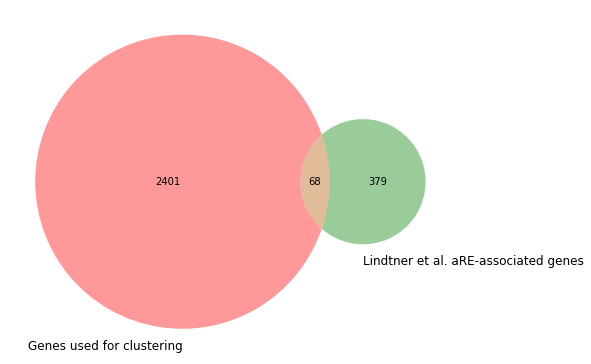

In [182]:
AB = len(intersection(aRE_genes, adata_genes.obs.index))
overlap = AB

Ab = len(adata_genes.obs.index) - AB
aB = len(aRE_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Genes used for clustering', 
                        'Lindtner et al. aRE-associated genes'))

Cluster 4 is significantly enriched in a.RE genes
Adjusted p value is 1.797200474934225e-15
['Bcl11a', 'Nnat', 'Dlx6os1', 'Dlx5', 'Zfp326', 'Tiam2', 'Abracl', 'Nol4', 'Foxp2', 'Gad2', 'Grip1', 'C530008M17Rik', 'Adarb2', 'Mpped2', 'Dlx2', 'Celf4', 'Elmo1', 'Dlx1', 'Nrxn3', 'Nav1', 'Sp8', 'Sp9', 'Sez6', 'Gad1', 'Khdrbs3', 'Anks1b', 'Asxl3']


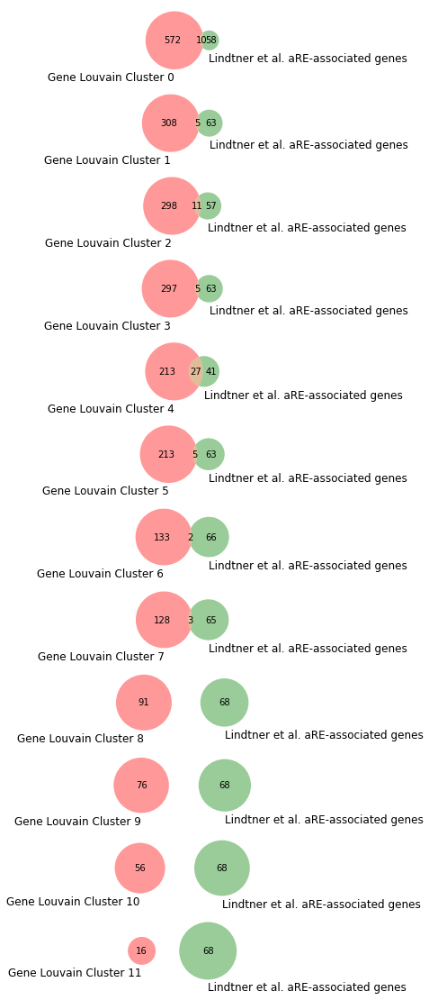

In [183]:
# Overlap with down genes (in Dlx1-Dlx2-)
figure, axes = plt.subplots(len(adata_genes.obs['louvain'].cat.categories), figsize=(140, 20))

for i, n_cluster in enumerate(adata_genes.obs['louvain'].cat.categories):

    louvain_query_genes = [gene for gene in adata_genes.obs.index if adata_genes.obs['louvain'][gene] == n_cluster]

    AB = len(intersection(louvain_query_genes, aRE_genes))
#    print(intersection(louvain_query_genes, aRE_genes))

    Ab = len(louvain_query_genes) - AB

    aB = overlap - AB

    p = venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Gene Louvain Cluster {}'.format(n_cluster), 
                        'Lindtner et al. aRE-associated genes'), 
              ax=axes[i])

    obs = np.array([[AB, aB], [Ab, adata_genes.X.shape[0] - AB - aB - Ab]])

    _, p_val, _, _ = chi2_contingency(obs)

    p_val_adj = p_val * len(adata_genes.obs['louvain'].cat.categories)
    
    direction_test = AB/Ab > aB/(adata_genes.X.shape[0] - AB - aB - Ab)

    if p_val_adj < 0.05:
#    if p_val < 0.05:
        if direction_test:
            print('Cluster', n_cluster, 'is significantly enriched in a.RE genes')
        else: 
            print('Cluster', n_cluster, 'is significantly depleted of a.RE genes')
        print('Adjusted p value is {}'.format(p_val_adj))
        print(intersection(louvain_query_genes, aRE_genes))
    
plt.show()

##### rRE-genes

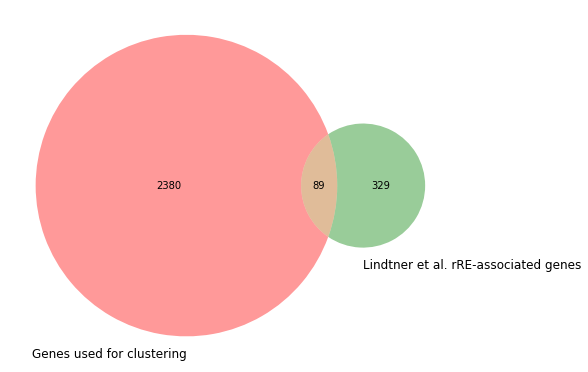

In [184]:
AB = len(intersection(rRE_genes, adata_genes.obs.index))
overlap = AB

Ab = len(adata_genes.obs.index) - AB
aB = len(rRE_genes) - AB

venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Genes used for clustering', 
                        'Lindtner et al. rRE-associated genes'))

Cluster 4 is significantly enriched in r.RE genes
Adjusted p value is 0.0009229849493114602
['Cited2', 'Mex3b', 'Syt1', 'Arx', 'Calm2', 'Pafah1b3', 'Cd24a', 'Fnbp1l', 'Nav3', 'Pak3', 'Casp3', 'Nfib', 'Pbx3', 'Zfp618', 'Dlx2', 'Gm17750', 'Dlx1', 'Dcx', 'Elavl2', 'Ptma']


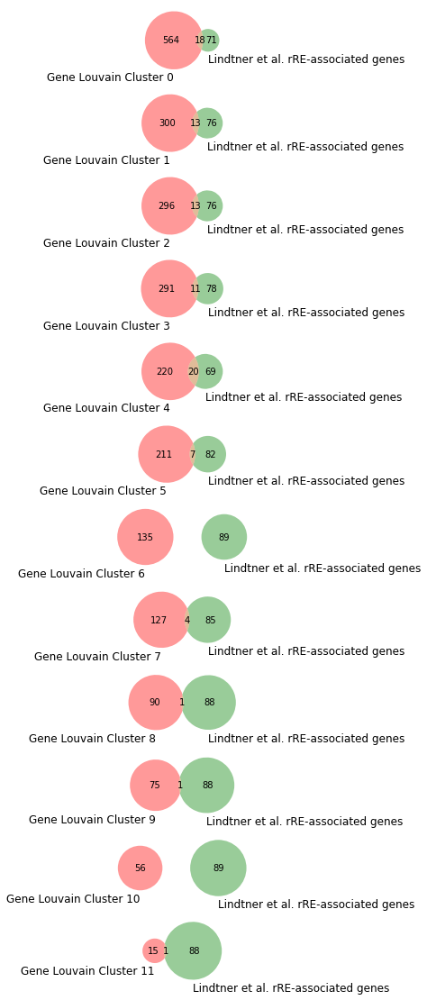

In [185]:
# Overlap with down genes (in Dlx1-Dlx2-)
figure, axes = plt.subplots(len(adata_genes.obs['louvain'].cat.categories), figsize=(140, 20))

for i, n_cluster in enumerate(adata_genes.obs['louvain'].cat.categories):

    louvain_query_genes = [gene for gene in adata_genes.obs.index if adata_genes.obs['louvain'][gene] == n_cluster]

    AB = len(intersection(louvain_query_genes, rRE_genes))
#    print(intersection(louvain_query_genes, aRE_genes))

    Ab = len(louvain_query_genes) - AB

    aB = overlap - AB

    p = venn2(subsets = (Ab, aB, AB), 
              set_labels = ('Gene Louvain Cluster {}'.format(n_cluster), 
                        'Lindtner et al. rRE-associated genes'), 
              ax=axes[i])

    obs = np.array([[AB, aB], [Ab, adata_genes.X.shape[0] - AB - aB - Ab]])

    _, p_val, _, _ = chi2_contingency(obs)

    p_val_adj = p_val * len(adata_genes.obs['louvain'].cat.categories)
    
    direction_test = AB/Ab > aB/(adata_genes.X.shape[0] - AB - aB - Ab)

    if p_val_adj < 0.05:
#    if p_val < 0.05:
        if direction_test:
            print('Cluster', n_cluster, 'is significantly enriched in r.RE genes')
        else: 
            print('Cluster', n_cluster, 'is significantly depleted of r.RE genes')
        print('Adjusted p value is {}'.format(p_val_adj))
        print(intersection(louvain_query_genes, rRE_genes))
    
plt.show()

## Miscellaneous: plotting genes and gene sets

### Import function and load data

In [52]:
from itertools import compress

In [49]:
adata_experiment_neural.write(neural_data_dir + 'POv2_BL41-42Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno.h5ad')

### Figure S6A

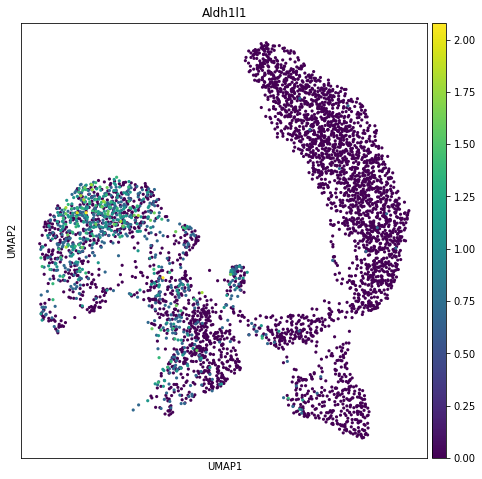

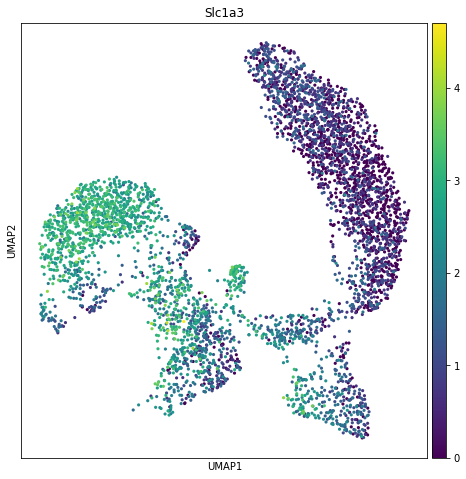

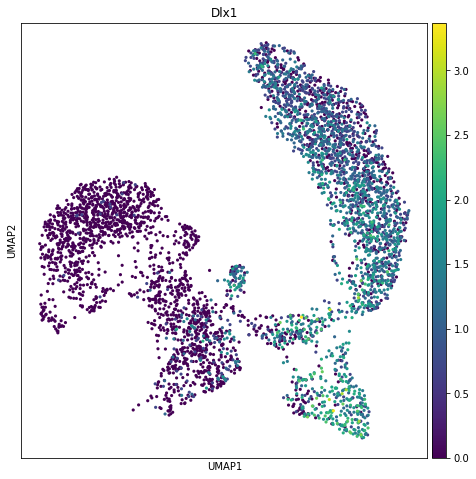

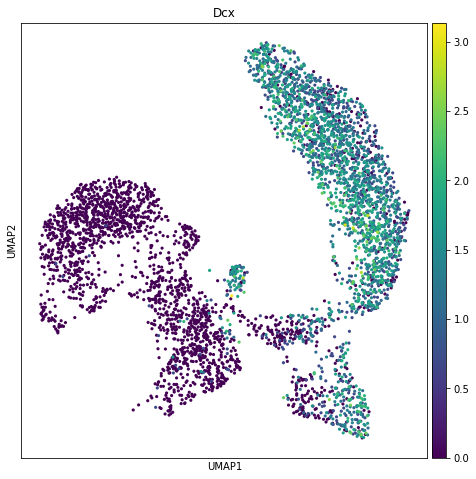

In [50]:
# Figure S6A
sc.pl.umap(adata_experiment_neural, color='Aldh1l1', size=40, use_raw=True, 
#           save='_experimental_MT_Aldh1l1.pdf'
          )
sc.pl.umap(adata_experiment_neural, color='Slc1a3', size=40, use_raw=True, 
#           save='_experimental_MT_Slc1a3.pdf'
          )
sc.pl.umap(adata_experiment_neural, color='Dlx1', size=40, use_raw=True, 
#           save='_experimental_MT_Dlx1.pdf'
          )
sc.pl.umap(adata_experiment_neural, color='Dcx', size=40, use_raw=True, 
#           save='_experimental_MT_Dcx.pdf'
          )

### Figure S6B

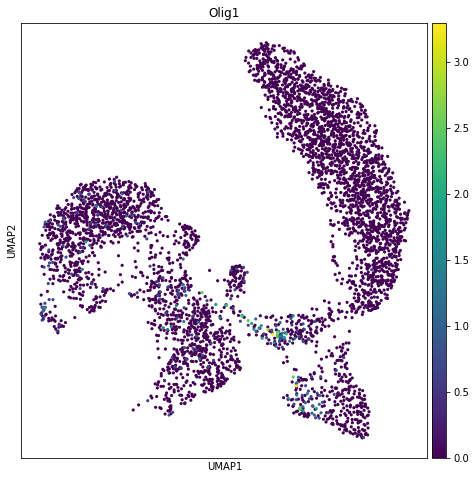

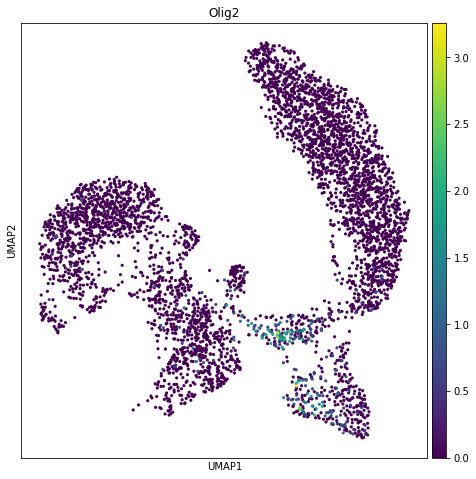

In [51]:
# Figure S6B
sc.pl.umap(adata_experiment_neural, color='Olig1', size=40, use_raw=True, 
#           save='_experimental_MT_Aldh1l1.pdf'
          )
sc.pl.umap(adata_experiment_neural, color='Olig2', size=40, use_raw=True, 
#           save='_experimental_MT_Slc1a3.pdf'
          )


### Figure S6CD

In [69]:
import csv

#### Astrocyte marker expression (Figure S6C)

In [53]:
# Taken from https://www.frontiersin.org/articles/10.3389/fncel.2016.00215/full
astrocyte_markers = ['Aldoc', 'Aqp4', 'Aldh1l1', 'Gja1', 'Gfap', 'Slc1a2', 'Slc1a3', 'Nfia', 'Nes', 'Pygb', 'S100b', 'Vim']

In [54]:
index = []
for gene in astrocyte_markers:
#     print (gene in adata_experiment_neural.raw.var.index)
    index.append(gene in adata_experiment_neural.raw.var.index)

In [55]:
len(astrocyte_markers)

12

In [56]:
astrocyte_markers = list(compress(astrocyte_markers, index))

In [57]:
len(astrocyte_markers)

12

In [58]:
# Calculate mean of log-transformed expression
adata_experiment_neural.obs['astrocyte_markers_mean'] = np.array(adata_experiment_neural.raw[:,astrocyte_markers].X.mean(axis=1)).flatten()

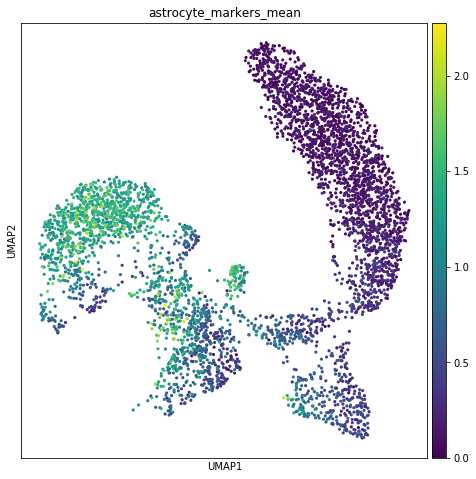

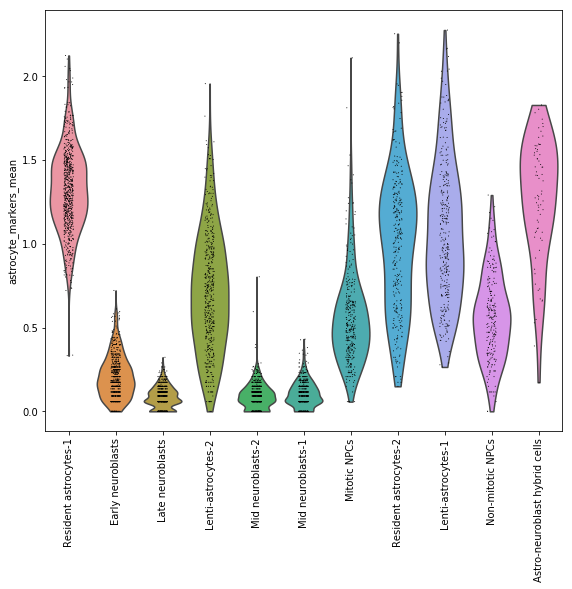

In [61]:
sc.pl.umap(adata_experiment_neural, color='astrocyte_markers_mean', size=40, 
#           save='_experimental_MT_astrocyte_markers_mean.pdf'
          )
sc.pl.violin(adata_experiment_neural, keys='astrocyte_markers_mean', groupby='louvain', rotation=90,
#              save='_lowMito_RA_astroMarkers.pdf'
            )

In [70]:
int_out_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Data/intermediate/'

In [71]:
with open(int_out_dir+'12_astrocyte_markers.csv', 'w') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(astrocyte_markers)

#### Oxphos gene expression (Figure S6D)

In [62]:
oxphos_genes = ["Abcd1",
"Actn3",
"Actn3",
"Afg1l",
"Ak4",
"Apoc3",
"Atp5a1",
"Atp5b",
"Atp5b",
"Atp5c1",
"Atp5d",
"Atp5h",
"Atp5j",
"Atp5j2",
"Atp5l",
"Atp5o",
"Atp5pb",
"Atp7a",
"Atpsckmt",
"Atpsckmt",
"Bdnf",
"Bid",
"Ccnb1",
"Cdk1",
"Chchd10",
"Coq7",
"Coq9",
"Cox4i1",
"Cox4i2",
"Cox5a",
"Cox5b",
"Cox5b",
"Cox6a1",
"Cox6a2",
"Cox7a1",
"Cox7a2",
"Cox7a2l",
"Cox7a2l",
"Cox7c",
"Cyc1",
"Cyc1",
"Cycs",
"Cycs",
"Cyct",
"Cyct",
"Dguok",
"Dld",
"Dnajc15",
"Dnajc30",
"Fxn",
"Fxn",
"Gadd45gip1",
"Iscu",
"Lexm",
"Mecp2",
"Mlxipl",
"Msh2",
"mt-Atp6",
"mt-Co1",
"mt-Co2",
"mt-Co3",
"mt-Cytb",
"mt-Nd2",
"mt-Nd4",
"mt-Nd4",
"mt-Nd4l",
"mt-Nd5",
"Mtch2",
"Myc",
"Myc",
"Myog",
"Ndufa7",
"Ndufa7",
"Ndufa8",
"Ndufa10",
"Ndufa10",
"Ndufa12",
"Ndufaf1",
"Ndufb6",
"Ndufb6",
"Ndufb6",
"Ndufb8",
"Ndufb9",
"Ndufc2",
"Ndufs1",
"Ndufs2",
"Ndufs2",
"Ndufs6",
"Ndufs8",
"Ndufv1",
"Ndufv1",
"Ndufv2",
"Ndufv2",
"Ndufv3",
"Ndufv3",
"Nipsnap2",
"Nupr1",
"Park7",
"Park7",
"Pde2a",
"Pde12",
"Pgk1",
"Pgk2",
"Pink1",
"Pink1",
"Ppif",
"Rhoa",
"Sdha",
"Sdhaf2",
"Sdhaf2",
"Sdhc",
"Sdhd",
"Shmt2",
"Shmt2",
"Shmt2",
"Slc25a23",
"Slc25a33",
"Snca",
"Stoml2",
"Stoml2",
"Surf1",
"Taz",
"Tefm",
"Tnf",
"Uqcc2",
"Uqcc2",
"Uqcc3",
"Uqcc3",
"Uqcr10",
"Uqcrb",
"Uqcrc1",
"Uqcrc1",
"Uqcrfs1",
"Uqcrh",
"Uqcrq",
"Vcp"]

In [63]:
index = []
for gene in oxphos_genes:
#     print (gene in adata_experiment_neural.raw.var.index)
    index.append(gene in adata_experiment_neural.raw.var.index)

In [64]:
len(oxphos_genes)

136

In [65]:
oxphos_genes = list(compress(oxphos_genes, index))

In [66]:
len(oxphos_genes)

129

In [67]:
adata_experiment_neural.obs['oxphos_genes_mean'] = np.array(adata_experiment_neural.raw[:,oxphos_genes].X.mean(axis=1)).flatten()

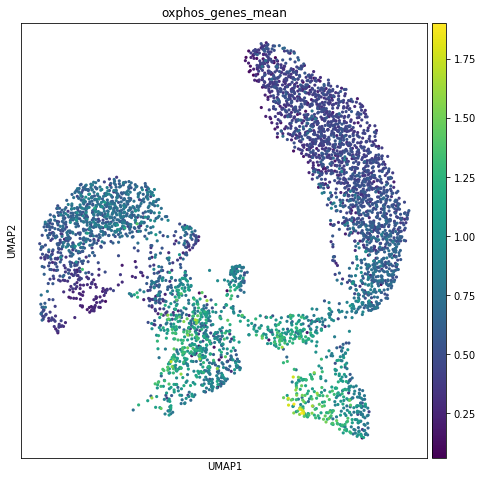

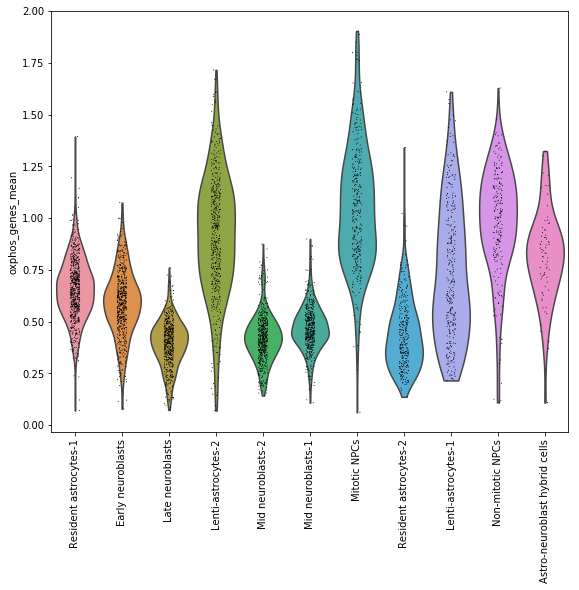

In [68]:
sc.pl.umap(adata_experiment_neural, color='oxphos_genes_mean', size=40, 
#          save='_experimental_MT_oxphos_129genes.pdf'
          )
sc.pl.violin(adata_experiment_neural, keys='oxphos_genes_mean', groupby='louvain', rotation=90, 
#              save='_lowMito_RA_oxphos.pdf'
            )

In [70]:
int_out_dir = '/project/GCRB/Hon_lab/s418610/Projects/03.Invivo_neuronal_reprogramming/99.Manuscript/Data/intermediate/'

In [72]:
with open(int_out_dir+'129_oxphos_genes.csv', 'w') as myfile:
    wr = csv.writer(myfile, quoting=csv.QUOTE_ALL)
    wr.writerow(oxphos_genes)

### 3.3 Comfirm the expression patterns of known marker genes

In [12]:
adata_experiment_neural =sc.read(neural_data_dir + 'POv2_BL41Only_NeuronalOnly_postFiltering_log_pcs50_Harmony_louvain_anno_pseudotime.h5ad')